In [1]:
# Import libraries
import os
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import matplotlib.gridspec as gridspec

In [2]:
# Here are my rc parameters for matplotlib
mpl.rc('font', serif='Helvetica Neue') 
mpl.rcParams.update({'font.size': 12})
mpl.rcParams['figure.figsize'] = 3.2, 2.8
mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['lines.linewidth'] = 0.5
mpl.rcParams['axes.linewidth'] = 1.5

# This link shows you how to greyscale a cmap
# https://jakevdp.github.io/PythonDataScienceHandbook/04.07-customizing-colorbars.html

In [3]:
def find(name):
    home = os.path.expanduser("~")
    for root, dirs, files in os.walk(home):
        if name in dirs:
            return os.path.join(root, name)

In [4]:
# First let's find all of our data
whingPath = find('whingdingdilly')
ipyPath = whingPath + '/ipython'
rootPath = ipyPath + '/figures_for_all_data'
dataPath = rootPath + '/data_folders'

activityRatioPath = dataPath + '/actRat_txt_01_22_19'
particleFractionPath = dataPath + '/parFrac_txt_01_22_19'
monodispersePath = dataPath + '/monotxt_01_22_19'
constantRatioPath = dataPath + '/constRatTxt_02_07_19'

# Go to the correct parent directory
os.chdir(dataPath)

# Create a list for the filenames
fileContainer = []
pathContainer = []

# Get files from each source directory
actRatFiles = os.listdir(activityRatioPath)
nActRatFiles = len(actRatFiles)
parFracFiles = os.listdir(particleFractionPath)
nParFracFiles = len(parFracFiles)
monoFiles = os.listdir(monodispersePath)
nMonoFiles = len(monoFiles)
constFiles = os.listdir(constantRatioPath)
nConstFiles = len(constFiles)

# Create list of sweep identifiers
sweepName = ['Activity Ratio', 'Particle Fraction', 'Monodisperse', 'Constant Activity Ratio']
# Populate the file container
fileContainer.append(actRatFiles)
fileContainer.append(parFracFiles)
fileContainer.append(monoFiles)
fileContainer.append(constFiles)
nSweeps = len(fileContainer)
# Populate the path container
pathContainer.append(activityRatioPath)
pathContainer.append(particleFractionPath)
pathContainer.append(monodispersePath)
pathContainer.append(constantRatioPath)

In [5]:
# Functions to sort my data with
def getFromTxt(fname, first, last):
    """Takes a string, text before and after desired text, outs text between"""
    start = fname.index( first ) + len( first )
    end = fname.index( last, start )
    myTxt = fname[start:end]
    return float(myTxt)
        
def multiSort(arr1, arr2, arr3):
    """Sort an array the slow (but certain) way, returns original indices in sorted order"""
    # Doing this for PeR, PeS, xS in this case
    cpy1 = np.copy(arr1)
    cpy2 = np.copy(arr2)
    cpy3 = np.copy(arr3)
    ind = np.arange(0, len(arr1))
    for i in xrange(len(cpy1)):
        for j in xrange(len(cpy1)):
            # Sort by first variable
            if cpy1[i] > cpy1[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            # If first variable is equal, resort to second variable
            elif cpy1[i] == cpy1[j] and cpy2[i] > cpy2[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] > cpy3[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]      
    return ind

def indSort(arr1, arr2):
    """Take sorted index array, use to sort array"""
    # arr1 is array to sort
    # arr2 is index array
    cpy = np.copy(arr1)
    for i in xrange(len(arr1)):
        arr1[i] = cpy[arr2[i]]

In [6]:
# Let's sort our respective lists
for i in xrange(nSweeps):
    paList = []
    pbList = []
    prList = []
    xfList = []
    for j in xrange(len(fileContainer[i])):
        paList.append(getFromTxt(fileContainer[i][j], "pa", "_pb"))
        pbList.append(getFromTxt(fileContainer[i][j], "pb", "_xa"))
        xfList.append(getFromTxt(fileContainer[i][j], "xa", "_ep"))
        xfList[j] = 100.0 - xfList[j]
        # We want to use ratios rounded to nearest 0.05
        try:
            tmpPeR = round(paList[j]/pbList[j] * 2, 1) / 2
        except:
            tmpPeR = 1.0
        prList.append(tmpPeR)
    # Now sort the array of txtFile names
    indArr = multiSort(prList, paList, xfList)
    indSort(fileContainer[i], indArr)
    
# Use this to check the parameter sort
# for i in xrange(len(fileContainer[1])):
#     print(fileContainer[1][i])

In [7]:
# Read the data for each parameter study into a pandas dataframe
all_sims = []
for i in xrange(nSweeps):
    all_sims.append([])
    os.chdir(pathContainer[i])
    for j in xrange(len(fileContainer[i])):
        df = pd.read_csv(fileContainer[i][j], sep='\s+', header=0)
        all_sims[i].append(df)
        
# Go back to the source folder (save figures here)
os.chdir(dataPath)        

# If you want to see what your data looks like
# display(all_sims[0][0])

# Get the name of each of the headers in the dataframes
list(all_sims[0][0])

['Timestep',
 'Gas_A',
 'Gas_B',
 'Gas_tot',
 'Dense_A',
 'Dense_B',
 'Dense_tot',
 'Lc_numA',
 'Lc_numB',
 'Lg_clust',
 'MCS',
 'sigALL',
 'sigAA',
 'sigAB',
 'sigBB',
 'phiEff',
 'lg_clustA',
 'tot_clustA',
 'LC_density',
 'DP_density',
 'GP_density']

In [8]:
# Make sure all data is chronilogical
def chkSort(array):
    """Make sure array is chronilogical"""
    for i in xrange(len(array)-2):
        if array[i] > array[i+1]:
            print("{} is not greater than {} for indices=({},{})").format(array[i+1], array[i], i, i+1)
            return False
    return True

# Check to see if timesteps are in order
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        myBool = chkSort(all_sims[i][j]['Timestep'])
        if myBool is False:
            print("{} is not chronilogically sorted!").format(fileContainer[i][j])
            exit(1)
        else:
            print("{} sorted... ").format(fileContainer[i][j])

diam_pa0_pb500_xa90_ep82.txt sorted... 
diam_pa0_pb500_xa70_ep82.txt sorted... 
diam_pa0_pb500_xa50_ep82.txt sorted... 
diam_pa0_pb500_xa30_ep82.txt sorted... 
diam_pa50_pb500_xa90_ep82.txt sorted... 
diam_pa50_pb500_xa70_ep82.txt sorted... 
diam_pa50_pb500_xa50_ep82.txt sorted... 
diam_pa50_pb500_xa30_ep82.txt sorted... 
diam_pa100_pb500_xa90_ep82.txt sorted... 
diam_pa100_pb500_xa70_ep82.txt sorted... 
diam_pa100_pb500_xa50_ep82.txt sorted... 
diam_pa100_pb500_xa30_ep82.txt sorted... 
diam_pa150_pb500_xa90_ep82.txt sorted... 
diam_pa150_pb500_xa70_ep82.txt sorted... 
diam_pa150_pb500_xa50_ep82.txt sorted... 
diam_pa150_pb500_xa30_ep82.txt sorted... 
diam_pa200_pb500_xa90_ep82.txt sorted... 
diam_pa200_pb500_xa70_ep82.txt sorted... 
diam_pa200_pb500_xa50_ep82.txt sorted... 
diam_pa200_pb500_xa30_ep82.txt sorted... 
diam_pa250_pb500_xa90_ep82.txt sorted... 
diam_pa250_pb500_xa70_ep82.txt sorted... 
diam_pa250_pb500_xa50_ep82.txt sorted... 
diam_pa250_pb500_xa30_ep82.txt sorted... 
diam

diam_pa20_pb40_xa70_ep8.txt sorted... 
diam_pa20_pb40_xa50_ep8.txt sorted... 
diam_pa20_pb40_xa30_ep8.txt sorted... 
diam_pa30_pb60_xa70_ep11.txt sorted... 
diam_pa30_pb60_xa50_ep11.txt sorted... 
diam_pa30_pb60_xa30_ep11.txt sorted... 
diam_pa40_pb80_xa70_ep14.txt sorted... 
diam_pa40_pb80_xa50_ep14.txt sorted... 
diam_pa40_pb80_xa30_ep14.txt sorted... 
diam_pa50_pb100_xa70_ep18.txt sorted... 
diam_pa50_pb100_xa50_ep18.txt sorted... 
diam_pa50_pb100_xa30_ep18.txt sorted... 
diam_pa60_pb120_xa70_ep21.txt sorted... 
diam_pa60_pb120_xa50_ep21.txt sorted... 
diam_pa60_pb120_xa30_ep21.txt sorted... 
diam_pa70_pb140_xa70_ep24.txt sorted... 
diam_pa70_pb140_xa50_ep24.txt sorted... 
diam_pa70_pb140_xa30_ep24.txt sorted... 
diam_pa80_pb160_xa70_ep27.txt sorted... 
diam_pa80_pb160_xa50_ep27.txt sorted... 
diam_pa80_pb160_xa30_ep27.txt sorted... 
diam_pa90_pb180_xa70_ep30.txt sorted... 
diam_pa90_pb180_xa50_ep30.txt sorted... 
diam_pa90_pb180_xa30_ep30.txt sorted... 
diam_pa100_pb200_xa70_ep34.t

In [9]:
# Add a column to the all_sims dataframe for number of clusters (of threshold size):
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        # New column for number of clusters
        all_sims[i][j]['nClust'] = all_sims[i][j]['Dense_tot'] / all_sims[i][j]['MCS']
        # Ger rid of NaN in favor of 0
        all_sims[i][j].fillna(0, inplace=True)

# display(all_sims[0][0])
list(all_sims[0][0])

['Timestep',
 'Gas_A',
 'Gas_B',
 'Gas_tot',
 'Dense_A',
 'Dense_B',
 'Dense_tot',
 'Lc_numA',
 'Lc_numB',
 'Lg_clust',
 'MCS',
 'sigALL',
 'sigAA',
 'sigAB',
 'sigBB',
 'phiEff',
 'lg_clustA',
 'tot_clustA',
 'LC_density',
 'DP_density',
 'GP_density',
 'nClust']

In [10]:
# Function that will sort wrt one variable
def singleSort(arr):
    for i in xrange(len(arr)):
        for j in xrange(len(arr)):
            if arr[i] < arr[j] and i > j:
                arr[i], arr[j] = arr[j], arr[i]
                
# Function to get conversion from timesteps to Brownian time
def computeTauPerTstep(epsilon):
    # This is actually indpendent of runtime :)
#     sigma = 1.0
#     threeEtaPiSigma = 1.0
#     runFor = 200
#     tauBrown = 1.0
#     tauLJ = ((sigma**2) * threeEtaPiSigma) / epsilon
#     dt = 0.00001 * tauLJ
#     simLength = runFor * tauBrown
#     totTsteps = int(simLength / dt)
#     tstepPerTau = int(totTsteps / float(simLength))
    kBT = 1.0
    tstepPerTau = int(epsilon / (kBT * 0.00001))
    return tstepPerTau

def theoryDenom(xF, peS, peF):
    xF /= 100.0
    xS = 1.0 - xF
    return 4.0 * ((xS * peS) + (xF * peF))

def theory(xF, peS, peF):
    kappa = 4.05
    xF /= 100.0
    xS = 1.0 - xF
    return ((3.0 * (np.pi**2) * kappa) / (4.0 * ((xS * peS) + (xF * peF))))

# Make an additional frame that gives total number of particles, and simulation parameters
params = []
for i in xrange(nSweeps):
    paramList = []
    for j in xrange(len(fileContainer[i])):
        partAll = all_sims[i][j]['Gas_tot'][0]
        partA = all_sims[i][j]['Gas_A'][0]
        partB = all_sims[i][j]['Gas_B'][0]
        pa = getFromTxt(fileContainer[i][j], "pa", "_pb")
        pb = getFromTxt(fileContainer[i][j], "pb", "_xa")
        xa = getFromTxt(fileContainer[i][j], "xa", "_ep")
        xf = 100.0 - xa
        ep = getFromTxt(fileContainer[i][j], "ep", ".txt")
        converT = computeTauPerTstep(ep)
        mytheoryDenom = theoryDenom(xf, pa, pb)
#         #Monodisperse slow
#         if xf == 0:
#             mytheory = theory(xf, pa, pb)
        if (pa != 0 and xa != 0) or (pb != 0 and xf != 0): 
            mytheory = theory(xf, pa, pb)
        else:
            mytheory = 0.0

        # This is monodisperse
        if pb == 0 and xa == 100:
            prat = 1.0

        # This is active/passive
        elif pb == 0 and xa != 100:
            prat = 0.0

        # Everything else
        else:
            # Round to the nearest tenths place
            prat = round(float(pa)/float(pb) * 2, 1) / 2

        paramList.append((partAll, partA, partB, pa, pb, xf, prat, ep, converT, mytheoryDenom, mytheory))

    # Put the data for this parameter sweep into it's own dataframe
    params.append(pd.DataFrame(paramList, columns=['partAll',
                                                  'partA',
                                                  'partB',
                                                  'peA',
                                                  'peB',
                                                  'xF',
                                                  'peR',
                                                  'eps',
                                                  'brownTime',
                                                  'theoryDenom',
                                                  'theory'])
                 )
    pd.set_option('display.max_rows', 2)
    display(params[i])

,partAll,partA,partB,peA,peB,xF,peR,eps,brownTime,theoryDenom,theory
0,100000,90000,10000,0.0,500.0,10.0,0.0,82.0,8199999,200.0,0.599578
...,...,...,...,...,...,...,...,...,...,...,...
42,100000,50000,50000,500.0,500.0,50.0,1.0,82.0,8199999,2000.0,0.059958


,partAll,partA,partB,peA,peB,xF,peR,eps,brownTime,theoryDenom,theory
0,100000,90000,10000,0.0,500.0,10.0,0.0,82.0,8199999,200.0,0.599578
...,...,...,...,...,...,...,...,...,...,...,...
93,100000,70000,30000,500.0,500.0,30.0,1.0,82.0,8199999,2000.0,0.059958


,partAll,partA,partB,peA,peB,xF,peR,eps,brownTime,theoryDenom,theory
0,100000,100000,0,0.0,0.0,0.0,1.0,1.0,99999,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
10,100000,100000,0,500.0,0.0,0.0,1.0,82.0,8199999,2000.0,0.059958


,partAll,partA,partB,peA,peB,xF,peR,eps,brownTime,theoryDenom,theory
0,50000,25000,25000,10.0,100.0,50.0,0.1,18.0,1799999,220.0,0.545071
...,...,...,...,...,...,...,...,...,...,...,...
163,50000,25000,25000,150.0,166.0,50.0,0.9,28.0,2800000,632.0,0.189740


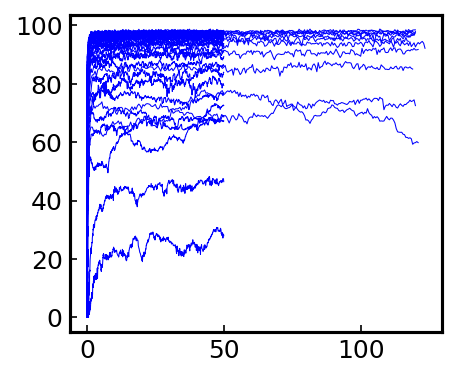

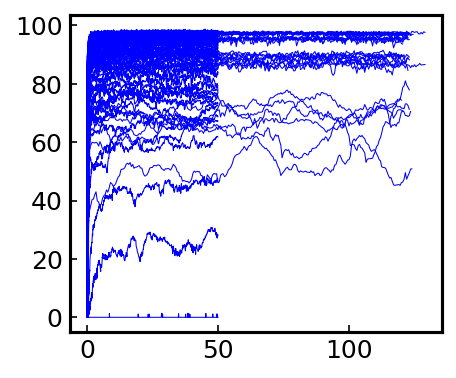

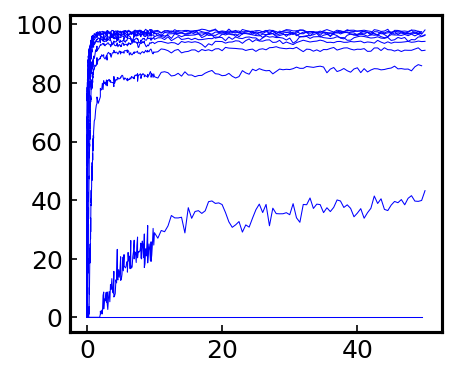

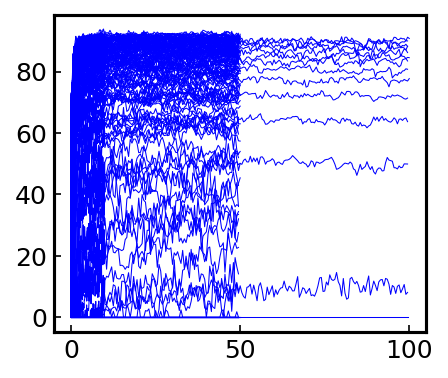

In [11]:
# Make sure I haven't messed up my data
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        plt.plot(all_sims[i][j]['Timestep'][:] / params[i]['brownTime'][j],
                 all_sims[i][j]['Dense_A'][:] / params[i]['partA'][j] * 100.0,
                 c='b',
                 label=str(params[i]['peR'][j]))
    plt.show()

Number of textfiles before delete: 43
Number of all_sims dataframes before delete: 43
Params rows before delete: 43
Number of textfiles after delete: 43
Number of all_sims dataframes after delete: 43
Params rows after delete: 43


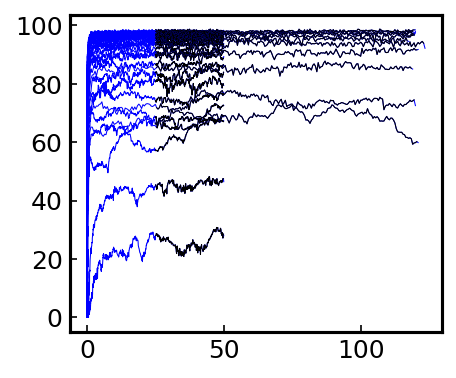

Number of textfiles before delete: 94
Number of all_sims dataframes before delete: 94
Params rows before delete: 94
Number of textfiles after delete: 94
Number of all_sims dataframes after delete: 94
Params rows after delete: 94


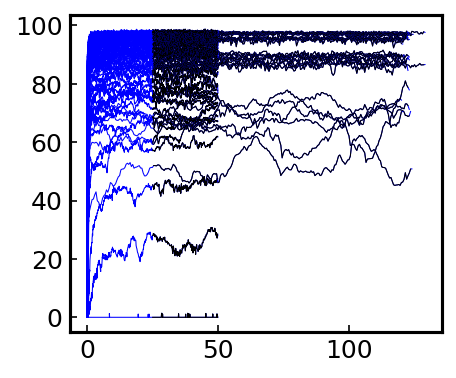

Number of textfiles before delete: 11
Number of all_sims dataframes before delete: 11
Params rows before delete: 11
Number of textfiles after delete: 11
Number of all_sims dataframes after delete: 11
Params rows after delete: 11


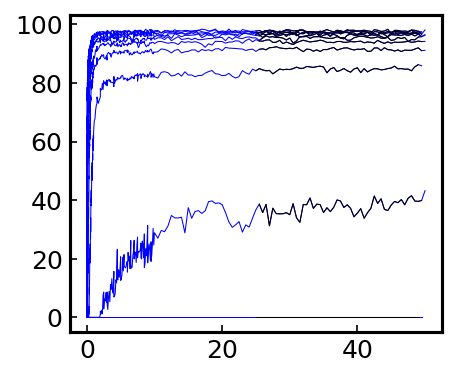

Number of textfiles before delete: 164
Number of all_sims dataframes before delete: 164
Params rows before delete: 164
Number of textfiles after delete: 159
Number of all_sims dataframes after delete: 159
Params rows after delete: 159


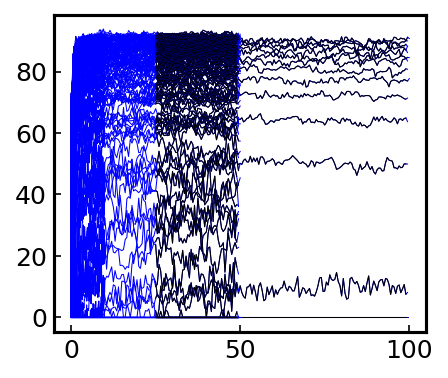

In [12]:
# We should average past a specific time, not an index number...
ssStartTime = 25.0
ssStartInd = [ [] for i in xrange(nSweeps) ]
badFiles = [ [] for i in xrange(nSweeps) ]

# Figure out what we should use for steady-state
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if all_sims[i][j]['Timestep'].iloc[-1] / params[i]['brownTime'][j] >= ssStartTime:
            for k in xrange(len(all_sims[i][j]['Timestep'])):
                if all_sims[i][j]['Timestep'][k] / params[i]['brownTime'][j] >= ssStartTime:
                    ssStartInd[i].append(k)
                    break
        else:
            badFiles[i].append(j)

# Delete rows of dataframe
for i in xrange(nSweeps):
    # Remove these indices from: txtFiles, all_sims, params
    print("Number of textfiles before delete: {}").format(len(fileContainer[i]))
    print("Number of all_sims dataframes before delete: {}").format(len(all_sims[i]))
    print("Params rows before delete: {}").format(len(params[i]['partAll']))
    if badFiles[i]:
        # You have to reverse the order so that you don't mess up your indexing
        for myindex in sorted(badFiles[i], reverse=True):
            del fileContainer[i][myindex]
            del all_sims[i][myindex]
            params[i].drop(params[i].index[myindex], inplace=True)  
    print("Number of textfiles after delete: {}").format(len(fileContainer[i]))
    print("Number of all_sims dataframes after delete: {}").format(len(all_sims[i]))
    print("Params rows after delete: {}").format(len(params[i]['partAll']))

    # You have to reindex the dataframe
    params[i].index = range(len(params[i]['partAll']))

    # Visual check to see if this is the appropriate time window for steady-state
    for j in xrange(len(fileContainer[i])):
        plt.plot(all_sims[i][j]['Timestep'][:] / params[i]['brownTime'][j],
                 all_sims[i][j]['Dense_A'][:] / params[i]['partA'][j] * 100.0,
                 c='b',
                 label=str(params[i]['peR'][j]))
        plt.plot(all_sims[i][j]['Timestep'][ssStartInd[i][j]:-1] / params[i]['brownTime'][j],
                 all_sims[i][j]['Dense_A'][ssStartInd[i][j]:-1] / params[i]['partA'][j] * 100.0,
                 c='k')
    plt.show()

In [13]:
# Get lists for distinct values that I might want to plot

# This is for the activity ratio study
distPeS = []
for j in xrange(len(fileContainer[0])):
    if params[0]['peA'][j] not in distPeS:
        distPeS.append(params[0]['peA'][j])
singleSort(distPeS)
print("{}, PeS: {}").format(sweepName[0], distPeS)

# This is for the particle fraction study
distxF = []
for j in xrange(len(fileContainer[1])):
    if params[1]['xF'][j] not in distxF:
        distxF.append(params[1]['xF'][j])
singleSort(distxF)
print("{}, xF: {}").format(sweepName[1], distxF)

# This is for monodisperse study
distPe = []
for j in xrange(len(fileContainer[2])):
    if params[2]['peA'][j] not in distPe:
        distPe.append(params[2]['peA'][j])
singleSort(distPe)
print("{}, Pe: {}").format(sweepName[2], distPe)

# This is for the constant activity ratio study
distPeR = []
for j in xrange(len(fileContainer[3])):
    if params[3]['peR'][j] not in distPeR:
        distPeR.append(params[3]['peR'][j])
singleSort(distPeR)
print("{}, PeR: {}").format(sweepName[3], distPeR)

Activity Ratio, PeS: [0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0, 350.0, 400.0, 450.0, 500.0]
Particle Fraction, xF: [0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0, 90.0]
Monodisperse, Pe: [0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0, 350.0, 400.0, 450.0, 500.0]
Constant Activity Ratio, PeR: [0.1, 0.3, 0.5, 0.7, 0.9]


In [14]:
# Now get time-based steady state values
all_SS = []
all_stdDev = []
all_var = []
for i in xrange(nSweeps):
    # Make list of steady state column headers
    headers = list(all_sims[i][0])
    headers.remove('Timestep')
    SS = pd.DataFrame(columns=headers)
    stdDev = pd.DataFrame(columns=headers)
    var = pd.DataFrame(columns=headers)
    # Initialize dataframes
    for j in xrange(len(fileContainer[i])):
        SS.loc[j] = [0] * len(headers)
        stdDev.loc[j] = [0] * len(headers)
        var.loc[j] = [0] * len(headers)

    # Make dataframe of steady-state data
    for j in xrange(len(fileContainer[i])):
        # Loop through each column (aside from tstep column)
        for k in range(1, len(all_sims[i][j].iloc[1])):
            # Compute mean of data after steady-state time (25tb) in jth column of ith file
            avg = np.mean(all_sims[i][j].iloc[ssStartInd[i][j]:-1, k])
            SS[headers[k-1]][j] = avg
            # Compute the standard deviation and variance in this data
            stdDevor = np.std(all_sims[i][j].iloc[ssStartInd[i][j]:-1, k])
            stdDev[headers[k-1]][j] = stdDevor
            var[headers[k-1]][j] = stdDevor ** 2

    # Normalize by number of particles
    for j in xrange(len(fileContainer[i])):
        if params[i]['partA'][j] != 0:
            SS['Gas_A'][j] /= params[i]['partA'][j]
            SS['Dense_A'][j] /= params[i]['partA'][j]
            SS['Lc_numA'][j] /= params[i]['partA'][j]
            # Now my standard error is a percentage
            stdDev['Gas_A'][j] /= params[i]['partA'][j]
            stdDev['Dense_A'][j] /= params[i]['partA'][j]
            stdDev['Lc_numA'][j] /= params[i]['partA'][j]
            var['Gas_A'][j] /= params[i]['partA'][j]
            var['Dense_A'][j] /= params[i]['partA'][j]
            var['Lc_numA'][j] /= params[i]['partA'][j]

        if params[i]['partB'][j] != 0:
            SS['Gas_B'][j] /= params[i]['partB'][j]
            SS['Dense_B'][j] /= params[i]['partB'][j]
            SS['Lc_numB'][j] /= params[i]['partB'][j]
            stdDev['Gas_B'][j] /= params[i]['partB'][j]
            stdDev['Dense_B'][j] /= params[i]['partB'][j]
            stdDev['Lc_numB'][j] /= params[i]['partB'][j]
            var['Gas_B'][j] /= params[i]['partB'][j]
            var['Dense_B'][j] /= params[i]['partB'][j]
            var['Lc_numB'][j] /= params[i]['partB'][j]

    SS['Gas_tot'][:] /= params[i]['partAll'][:]
    SS['Dense_tot'][:] /= params[i]['partAll'][:] 
    SS['Lg_clust'][:] /= params[i]['partAll'][:] 
    SS['MCS'][:] /= params[i]['partAll'][:]
    stdDev['Gas_tot'][:] /= params[i]['partAll'][:]
    stdDev['Dense_tot'][:] /= params[i]['partAll'][:] 
    stdDev['Lg_clust'][:] /= params[i]['partAll'][:] 
    stdDev['MCS'][:] /= params[i]['partAll'][:]
    var['Gas_tot'][:] /= params[i]['partAll'][:]
    var['Dense_tot'][:] /= params[i]['partAll'][:] 
    var['Lg_clust'][:] /= params[i]['partAll'][:] 
    var['MCS'][:] /= params[i]['partAll'][:]

    SS['Gas_A'][:] *= 100.0
    SS['Gas_B'][:] *= 100.0
    SS['Gas_tot'][:] *= 100.0
    SS['Dense_A'][:] *= 100.0
    SS['Dense_B'][:] *= 100.0
    SS['Dense_tot'][:] *= 100.0
    SS['Lc_numA'][:] *= 100.0
    SS['Lc_numB'][:] *= 100.0
    SS['Lg_clust'][:] *= 100.0
    SS['MCS'][:] *= 100.0
    stdDev['Gas_A'][:] *= 100.0
    stdDev['Gas_B'][:] *= 100.0
    stdDev['Gas_tot'][:] *= 100.0
    stdDev['Dense_A'][:] *= 100.0
    stdDev['Dense_B'][:] *= 100.0
    stdDev['Dense_tot'][:] *= 100.0
    stdDev['Lc_numA'][:] *= 100.0
    stdDev['Lc_numB'][:] *= 100.0
    stdDev['Lg_clust'][:] *= 100.0
    stdDev['MCS'][:] *= 100.0
    var['Gas_A'][:] *= 100.0
    var['Gas_B'][:] *= 100.0
    var['Gas_tot'][:] *= 100.0
    var['Dense_A'][:] *= 100.0
    var['Dense_B'][:] *= 100.0
    var['Dense_tot'][:] *= 100.0
    var['Lc_numA'][:] *= 100.0
    var['Lc_numB'][:] *= 100.0
    var['Lg_clust'][:] *= 100.0
    var['MCS'][:] *= 100.0
    
    # Put these values into the modular container
    all_SS.append(SS)
    all_stdDev.append(stdDev)
    all_var.append(var)
    # Delete these and loop through next parameter sweep
    del SS
    del stdDev
    del var
    
pd.set_option('display.max_rows', 6)
display(all_SS[0])

,Gas_A,Gas_B,Gas_tot,Dense_A,Dense_B,Dense_tot,Lc_numA,Lc_numB,Lg_clust,MCS,...,sigAA,sigAB,sigBB,phiEff,lg_clustA,tot_clustA,LC_density,DP_density,GP_density,nClust
0,74.3107,46.0849,71.4881,25.6893,53.9151,28.5119,16.9288,34.5992,18.6958,12.925,...,1.00076,1.00061,1.00053,0.6,14704.3,22425.1,1.27,1.27,0.658795,3.56252
1,36.5184,10.1041,28.5941,63.4816,89.8959,71.4059,61.8456,87.4451,69.5254,60.2797,...,1.0004,1.00038,1.00032,0.6,54645.4,56123.4,1.27,1.27,0.381526,1.42571
2,31.2066,5.41386,18.3102,68.7934,94.5861,81.6898,67.8256,93.4688,80.6472,69.3523,...,1.00029,1.00025,1.00023,0.6,63372.6,64191.9,1.27,1.27,0.273979,1.32461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40,1.96376,1.91032,1.95842,98.0362,98.0897,98.0416,98.0032,98.0552,98.0084,96.8611,...,1.00006,1.00006,1.00001,0.6,76984.1,77010.2,1.27,1.27,0.0363855,1.0241
41,2.19969,2.1908,2.19702,97.8003,97.8092,97.803,97.7202,97.7275,97.7224,95.2663,...,1.00006,1.00006,1.00004,0.6,76759.2,76822.5,1.27,1.27,0.0406024,1.05221
42,2.07494,2.07651,2.07572,97.9251,97.9235,97.9243,97.8609,97.8592,97.86,96.3718,...,1.00004,1.00005,1.00006,0.6,76866.9,76917.3,1.27,1.27,0.0387302,1.03175


In [15]:
# Okay, now we have all of our data wrangled, we can plot it
from collections import OrderedDict

myCols = ['#26284A',
          '#01545B',
          '#017351',
          '#02C383',
          '#AAD962',
          '#FABF45',
          '#EF6A32',
          '#ED0245',
          '#A1295E',
          '#700161',
          'k']

myShps = ['o',
          '^',
          's',
          'D',
          'P',
          'X',
          '*',
          '<']

def getCol(peR):
    index = int(peR * 10) - 1
    return myCols[index]

# def pesToCol(peS):
#     index = 

def getShp(xA):
    index = int(xA / 10)
    return myShps[index]

In [16]:
# Okay now we can plot things :)

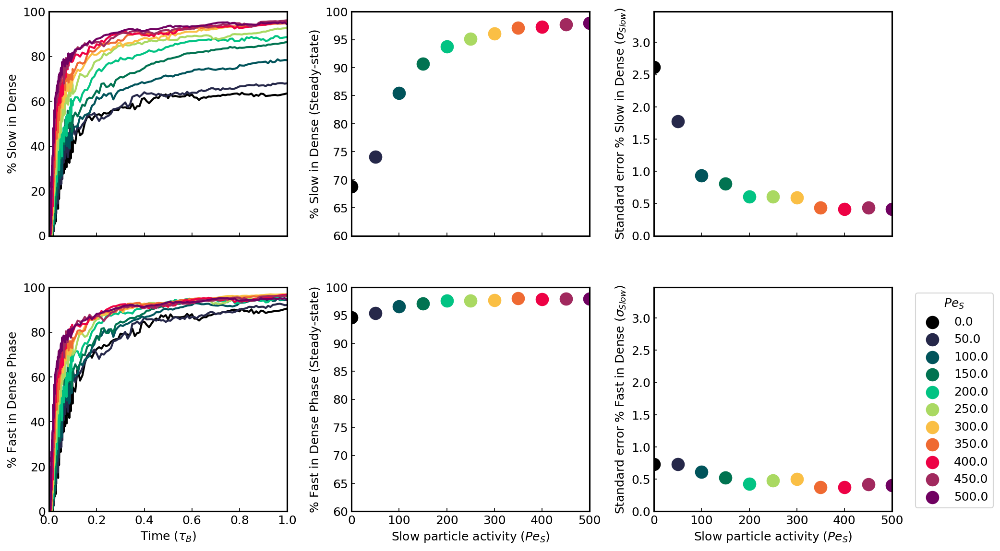

In [17]:
# Line width
mylw = 2.0
# Marker size
mysz = 150.0
# Sweep to look at
swp = 0
# List of distinct variables
var = distPeS
# Variable name
varName = 'peA'
# Hold variable constant
constName = 'xF'
constVal = 50

##############################
### All for slow particles ###
##############################

fig, ax = plt.subplots(2, 3, figsize=(14, 8))
# First row constant particle fraction (xA = 50), activity ratio study
for i in xrange(len(fileContainer[swp])):
    # Hold particle fraction constant
    if params[swp][constName][i] == constVal:
        # This is 1tauB data
        ax[0][0].plot(all_sims[swp][i]['Timestep'] / params[swp]['brownTime'][i],
                   all_sims[swp][i]['Dense_A'] / params[swp]['partA'][i] * 100.0,
                   label=params[swp][varName][i],
                   lw=mylw,
                   c=getCol(params[swp][varName][i] / max(var))
                  )
        # This is SS data
        ax[0][1].scatter(params[swp][varName][i],
                      all_SS[swp]['Dense_A'][i],
                      label=params[swp][varName][i],
                      s=mysz,
                      c=getCol(params[swp][varName][i] / max(var))
                     )

        # This is standard error data
        ax[0][2].scatter(params[swp][varName][i],
                      all_stdDev[swp]['Dense_A'][i],
                      label=params[swp][varName][i],
                      s=mysz,
                      c=getCol(params[swp][varName][i] / max(var))
                     )

# Settings for 1tauB data
ax[0][0].set_xlim(0, 1.0)
# ax[0][0].set_xlabel(r'Time $(\tau_{B})$')
# ax[0][0].set_xticks([])
labels = [item.get_text() for item in ax[0][0].get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax[0][0].set_xticklabels(empty_string_labels)
ax[0][0].set_ylim(0, 100.0)
ax[0][0].set_ylabel(r'% Slow in Dense')

# Settings for SS data
ax[0][1].set_xlim(0, max(var))
# ax[0][1].set_xlabel(r'Slow particle activity $(Pe_{S})$')
# ax[0][1].set_xticks([])
labels = [item.get_text() for item in ax[0][1].get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax[0][1].set_xticklabels(empty_string_labels)
ax[0][1].set_ylim(60.0, 100.0)
ax[0][1].set_ylabel(r'% Slow in Dense (Steady-state)')
    
# Settings for standard error data
ax[0][2].set_xlim(0, max(var))
# ax[0][2].set_xlabel(r'Slow particle activity $(Pe_{S})$')
# ax[0][2].set_xticks([])
labels = [item.get_text() for item in ax[0][2].get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax[0][2].set_xticklabels(empty_string_labels)
ax[0][2].set_ylim(0, max(all_stdDev[swp]['Dense_A'][:]))
ax[0][2].set_ylabel(r'Standard error % Slow in Dense $(\sigma_{Slow})$')

# Legend details
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[0][2].legend(by_label.values(), by_label.keys(), title=r'$Pe_{S}$', loc = 4, bbox_to_anchor=(1.55, -0.085))

###############################
### Same for fast particles ###
###############################

# fig, ax = plt.subplots(1, 3, figsize=(14, 4))
# First row constant particle fraction (xA = 50), activity ratio study
for i in xrange(len(fileContainer[swp])):
    # Hold particle fraction constant
    if params[swp][constName][i] == constVal:
        # This is 1tauB data
        ax[1][0].plot(all_sims[swp][i]['Timestep'] / params[swp]['brownTime'][i],
                   all_sims[swp][i]['Dense_B'] / params[swp]['partB'][i] * 100.0,
                   label=params[swp][varName][i],
                   lw=mylw,
                   c=getCol(params[swp][varName][i] / max(var))
                  )
        # This is SS data
        ax[1][1].scatter(params[swp][varName][i],
                      all_SS[swp]['Dense_B'][i],
                      label=params[swp][varName][i],
                      s=mysz,
                      c=getCol(params[swp][varName][i] / max(var))
                     )

        # This is standard error data
        ax[1][2].scatter(params[swp][varName][i],
                      all_stdDev[swp]['Dense_B'][i],
                      label=params[swp][varName][i],
                      s=mysz,
                      c=getCol(params[swp][varName][i] / max(var))
                     )

# Settings for 1tauB data
ax[1][0].set_xlim(0, 1.0)
ax[1][0].set_xlabel(r'Time $(\tau_{B})$')
ax[1][0].set_ylim(0, 100.0)
ax[1][0].set_ylabel(r'% Fast in Dense Phase')

# Settings for SS data
ax[1][1].set_xlim(0, max(var))
ax[1][1].set_xlabel(r'Slow particle activity $(Pe_{S})$')
ax[1][1].set_ylim(60.0, 100.0)
ax[1][1].set_ylabel(r'% Fast in Dense Phase (Steady-state)')
    
# Settings for standard error data
ax[1][2].set_xlim(0, max(var))
ax[1][2].set_xlabel(r'Slow particle activity $(Pe_{S})$')
ax[1][2].set_ylim(0, max(all_stdDev[swp]['Dense_A'][:]))
ax[1][2].set_ylabel(r'Standard error % Fast in Dense $(\sigma_{Slow})$')

# Legend details
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[1][2].legend(by_label.values(), by_label.keys(),
                title=r'$Pe_{S}$', loc = 4, bbox_to_anchor=(1.45, -0.01))

plt.tight_layout()
plt.show()

# Second row constant activity
plt.close()


[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


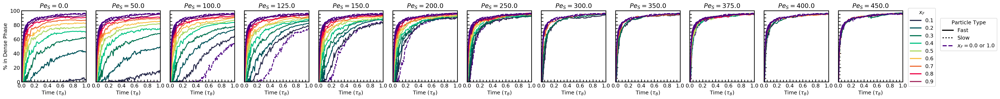

In [18]:
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 1.0)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.05))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_all_vs_time.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


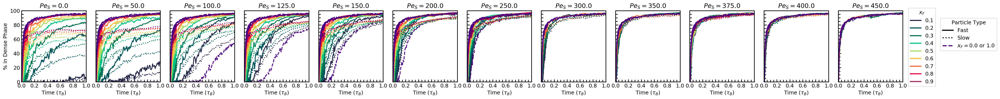

In [19]:
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle=':',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_B'] / params[1]['partB'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 1.0)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.05))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_vs_time.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


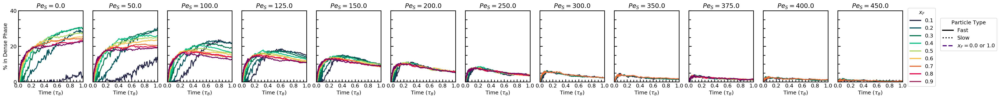

In [20]:
# We can plot the difference as well (% of Fast - % of Slow)
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == PeSinxF[i]:
            if params[1]['xF'][j] != 0.0:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           (all_sims[1][j]['Dense_B'] / params[1]['partB'][j] * 100.0) - (all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0),
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 1.0)
                ax[i].set_ylim(0, 40.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.05))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_all_vs_time_difference.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


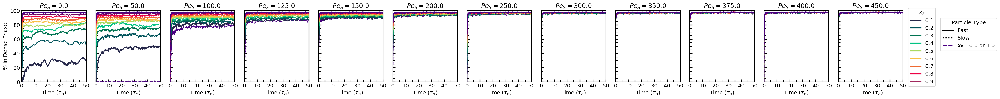

In [21]:
# Longer timescale
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 50.0)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(10))
                ax[i].xaxis.set_minor_locator(MultipleLocator(5))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_all_vs_time_long.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


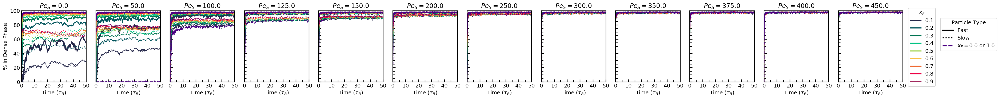

In [22]:
# Longer timescale
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle=':',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].plot(all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_B'] / params[1]['partB'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 50.0)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(10))
                ax[i].xaxis.set_minor_locator(MultipleLocator(5))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_vs_time_long.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


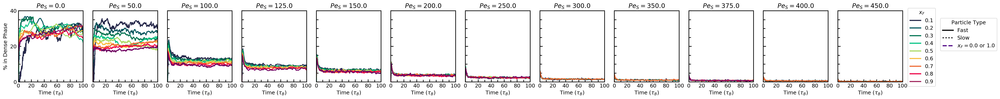

In [23]:
# Longer timescale for difference
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == PeSinxF[i]:
            if params[1]['xF'][j] != 0.0:
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           (all_sims[1][j]['Dense_B'] / params[1]['partB'][j] * 100.0) - (all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0),
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(0, 100.0)
                ax[i].set_ylim(0, 40.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Time $(\tau_{B})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(20))
                ax[i].xaxis.set_minor_locator(MultipleLocator(10))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_all_vs_time_difference_long.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


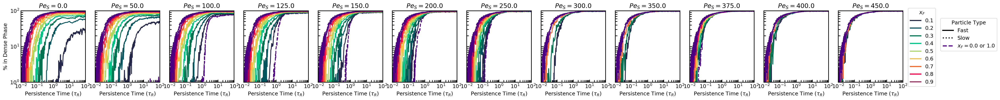

In [24]:
# Log-log: all particles
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(10**-2, 10**2)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Persistence Time $(\tau_{R})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(10))
                ax[i].xaxis.set_minor_locator(MultipleLocator(5))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                ax[i].set_xscale('log')
                ax[i].set_yscale('log')
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_all_vs_time_long_loglog.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[0.0, 50.0, 100.0, 125.0, 150.0, 200.0, 250.0, 300.0, 350.0, 375.0, 400.0, 450.0]


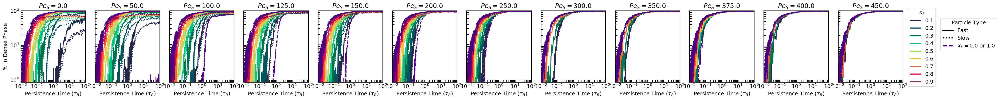

In [25]:
# Log-log: all particles
# Let's get the PeS values for the xS study
PeSinxF = []
for i in xrange(len(fileContainer[1])):
    if params[1]['peA'][i] not in PeSinxF:
        PeSinxF.append(params[1]['peA'][i])
PeSinxF.remove(500)
print(PeSinxF)

# # Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500:
            ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           linestyle='--',
                           label=0.0,
                           lw=mylw,
                           c='#4B0082'
                          )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_tot'] / params[1]['partAll'][j] * 100.0,
                           linestyle='--',
                           label=1.0,
                           lw=mylw,
                           c='#4B0082'
                          )
            else:
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_A'] / params[1]['partA'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle=':',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].plot(3.0 * all_sims[1][j]['Timestep'] / params[1]['brownTime'][j],
                           all_sims[1][j]['Dense_B'] / params[1]['partB'][j] * 100.0,
                           label=params[1]['xF'][j] / 100.0,
                           linestyle='-',
                           lw=mylw,
                           c=getCol(params[1]['xF'][j] / max(distxF))
                          )
                ax[i].set_xlim(10**-2, 10**2)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Persistence Time $(\tau_{R})$')
                
                # I can set all my ticks in this loop
                ax[i].xaxis.set_major_locator(MultipleLocator(10))
                ax[i].xaxis.set_minor_locator(MultipleLocator(5))
                ax[i].yaxis.set_major_locator(MultipleLocator(20))
                ax[i].yaxis.set_minor_locator(MultipleLocator(5))
                
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                
                if i > 0:
                    ax[i].tick_params(labelleft=False)
                ax[i].set_xscale('log')
                ax[i].set_yscale('log')
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=myCols[0], lw=leglw, label=r'$0.1$'),
                   Line2D([0], [0], color=myCols[1], lw=leglw, label=r'$0.2$'),
                   Line2D([0], [0], color=myCols[2], lw=leglw, label=r'$0.3$'),
                   Line2D([0], [0], color=myCols[3], lw=leglw, label=r'$0.4$'),
                   Line2D([0], [0], color=myCols[4], lw=leglw, label=r'$0.5$'),
                   Line2D([0], [0], color=myCols[5], lw=leglw, label=r'$0.6$'),
                   Line2D([0], [0], color=myCols[6], lw=leglw, label=r'$0.7$'),
                   Line2D([0], [0], color=myCols[7], lw=leglw, label=r'$0.8$'),
                   Line2D([0], [0], color=myCols[8], lw=leglw, label=r'$0.9$'),
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.55, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.5, 0.4))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.savefig('particle_fraction_vs_time_long_loglog.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

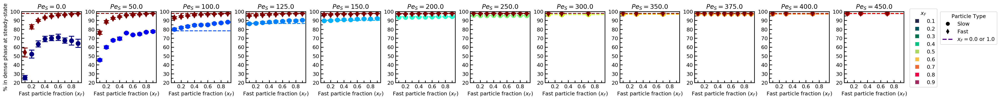

In [26]:
# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    flag = 0
    bottomMono = 0
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c=plt.cm.jet(1.0),
                          zorder=0
                         )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                bottomMono = 1
                ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                              linestyle='--',
                              label=1.0,
                              lw=mylw,
                              c=plt.cm.jet(params[1]['peA'][j] / 500.0),
                              zorder=0
                             )
            else:
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_A'][j],
                               yerr=all_stdDev[1]['Dense_A'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='o',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=plt.cm.jet(params[1]['peA'][j] / 500.0)
                              )
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_B'][j],
                               yerr=all_stdDev[1]['Dense_B'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='d',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=plt.cm.jet(1.0)
                              )
                ax[i].set_xlim(0.05, 0.95)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Fast particle fraction $(x_{F})$')
                
                # Set x-axis ticks
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                ax[i].set_ylim(20, 100)
    if bottomMono == 0:
        for j in xrange(len(fileContainer[2])):
            if PeSinxF[i] == params[2]['peA'][j]:
                # Plot the lower monodisperse line
                ax[i].axhline(y = all_SS[2]['Dense_A'][j],
                              linestyle='--',
                              label=params[2]['peA'][j],
                              lw=mylw,
                              c=plt.cm.jet(params[2]['peA'][j] / 500.0),
                              zorder=0
                             )
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
ax[0].set_ylim(20, 100)
ax[1].set_ylim(40, 100)
ax[2].set_ylim(75, 100)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(5))
ax[2].yaxis.set_minor_locator(MultipleLocator(1))
ax[3].yaxis.set_major_locator(MultipleLocator(5))
ax[3].yaxis.set_minor_locator(MultipleLocator(1))

for i in range(0, figLength):
    ax[i].set_ylim(20, 100)
    ax[i].yaxis.set_major_locator(MultipleLocator(10))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))


# for i in range(3, figLength):
#     ax[i].set_ylim(85, 100)
#     ax[i].yaxis.set_major_locator(MultipleLocator(5))
#     ax[i].yaxis.set_minor_locator(MultipleLocator(1))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[0], markersize=msz, label=r'$0.1$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[1], markersize=msz, label=r'$0.2$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[2], markersize=msz, label=r'$0.3$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[3], markersize=msz, label=r'$0.4$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[4], markersize=msz, label=r'$0.5$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[5], markersize=msz, label=r'$0.6$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[6], markersize=msz, label=r'$0.7$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[7], markersize=msz, label=r'$0.8$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[8], markersize=msz, label=r'$0.9$')]
# Legend for type
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]

leglw = 2
# leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
#         Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
#         Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
#        ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, bbox_to_anchor=(1.6, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(2.6, 0.5))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.25)

plt.savefig('particle_fraction_ss_w_std_dev.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

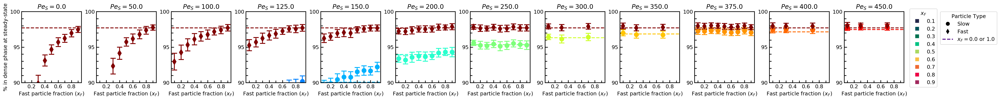

In [27]:
# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    flag = 0
    bottomMono = 0
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c=plt.cm.jet(1.0),
                          zorder=0
                         )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                bottomMono = 1
                ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                              linestyle='--',
                              label=1.0,
                              lw=mylw,
                              c=plt.cm.jet(params[1]['peA'][j] / 500.0),
                              zorder=0
                             )
            else:
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_A'][j],
                               yerr=all_stdDev[1]['Dense_A'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='o',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=plt.cm.jet(params[1]['peA'][j] / 500.0)
                              )
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_B'][j],
                               yerr=all_stdDev[1]['Dense_B'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='d',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=plt.cm.jet(1.0)
                              )
                ax[i].set_xlim(0.05, 0.95)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Fast particle fraction $(x_{F})$')
                
                # Set x-axis ticks
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                ax[i].set_ylim(20, 100)
    if bottomMono == 0:
        for j in xrange(len(fileContainer[2])):
            if PeSinxF[i] == params[2]['peA'][j]:
                # Plot the lower monodisperse line
                ax[i].axhline(y = all_SS[2]['Dense_A'][j],
                              linestyle='--',
                              label=params[2]['peA'][j],
                              lw=mylw,
                              c=plt.cm.jet(params[2]['peA'][j] / 500.0),
                              zorder=0
                             )
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
ax[0].set_ylim(20, 100)
ax[1].set_ylim(40, 100)
ax[2].set_ylim(75, 100)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(5))
ax[2].yaxis.set_minor_locator(MultipleLocator(1))
ax[3].yaxis.set_major_locator(MultipleLocator(5))
ax[3].yaxis.set_minor_locator(MultipleLocator(1))

for i in range(0, figLength):
    ax[i].set_ylim(90, 100)
    ax[i].yaxis.set_major_locator(MultipleLocator(5))
    ax[i].yaxis.set_minor_locator(MultipleLocator(1))


# for i in range(3, figLength):
#     ax[i].set_ylim(85, 100)
#     ax[i].yaxis.set_major_locator(MultipleLocator(5))
#     ax[i].yaxis.set_minor_locator(MultipleLocator(1))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[0], markersize=msz, label=r'$0.1$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[1], markersize=msz, label=r'$0.2$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[2], markersize=msz, label=r'$0.3$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[3], markersize=msz, label=r'$0.4$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[4], markersize=msz, label=r'$0.5$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[5], markersize=msz, label=r'$0.6$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[6], markersize=msz, label=r'$0.7$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[7], markersize=msz, label=r'$0.8$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[8], markersize=msz, label=r'$0.9$')]
# Legend for type
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]

leglw = 2
# leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
#         Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
#         Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
#        ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, bbox_to_anchor=(1.6, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(2.6, 0.5))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.25)

plt.savefig('particle_fraction_ss_w_std_dev_zoom.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

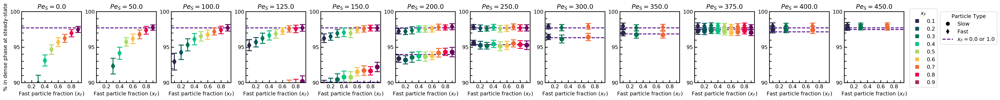

In [28]:
# Zoomed in (all of them)
# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    flag = 0
    bottomMono = 0
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c='#4B0082',
                          zorder=0
                         )
        if params[1]['peA'][j] == PeSinxF[i]:
            # Monodisperse
            if params[1]['xF'][j] == 0.0:
                bottomMono = 1
                ax[i].axhline(y = all_SS[1]['Dense_A'][j],
                              linestyle='--',
                              label=1.0,
                              lw=mylw,
                              c='#4B0082',
                              zorder=0
                             )
            else:
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_A'][j],
                               yerr=all_stdDev[1]['Dense_A'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='o',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=getCol(params[1]['xF'][j] / max(distxF))
                              )
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_B'][j],
                               yerr=all_stdDev[1]['Dense_B'][j],
                               label=params[1]['xF'][j] / 100.0,
                               marker='d',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=getCol(params[1]['xF'][j] / max(distxF))
                              )
                ax[i].set_xlim(0.05, 0.95)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Fast particle fraction $(x_{F})$')
                
                # Set x-axis ticks
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                ax[i].set_ylim(20, 100)
    if bottomMono == 0:
        for j in xrange(len(fileContainer[2])):
            if PeSinxF[i] == params[2]['peA'][j]:
                # Plot the lower monodisperse line
                ax[i].axhline(y = all_SS[2]['Dense_A'][j],
                              linestyle='--',
                              label=params[2]['peA'][j],
                              lw=mylw,
                              c='#4B0082',
                              zorder=0
                             )
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
ax[0].set_ylim(20, 100)
ax[1].set_ylim(40, 100)
ax[2].set_ylim(75, 100)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(5))
ax[2].yaxis.set_minor_locator(MultipleLocator(1))
ax[3].yaxis.set_major_locator(MultipleLocator(5))
ax[3].yaxis.set_minor_locator(MultipleLocator(1))

for i in range(0, figLength):
    ax[i].set_ylim(90, 100)
    ax[i].yaxis.set_major_locator(MultipleLocator(5))
    ax[i].yaxis.set_minor_locator(MultipleLocator(1))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[0], markersize=msz, label=r'$0.1$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[1], markersize=msz, label=r'$0.2$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[2], markersize=msz, label=r'$0.3$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[3], markersize=msz, label=r'$0.4$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[4], markersize=msz, label=r'$0.5$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[5], markersize=msz, label=r'$0.6$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[6], markersize=msz, label=r'$0.7$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[7], markersize=msz, label=r'$0.8$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[8], markersize=msz, label=r'$0.9$')]
# Legend for type
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]

leglw = 2
# leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
#         Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
#         Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
#        ]
colLeg = ax[-1].legend(title=r'$x_{F}$', handles=legend_elements, loc = 4, bbox_to_anchor=(1.6, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(2.6, 0.5))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.25)

plt.savefig('particle_fraction_ss_w_std_dev_zoom.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

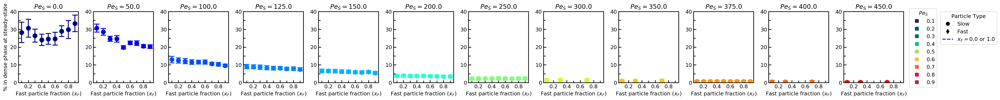

In [29]:
# Plot the steady-state difference
def propError(err1, err2):
    return np.sqrt((err1**2)+(err2**2))

mysz = 10
figLength = len(PeSinxF)
scale = 3
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale))
for i in xrange(len(PeSinxF)):
    flag = 0
    bottomMono = 0
    for j in xrange(len(fileContainer[1])):
        if params[1]['peA'][j] == PeSinxF[i]:
            if params[1]['xF'][j] != 0.0:
                ax[i].errorbar(params[1]['xF'][j] / 100.0,
                               all_SS[1]['Dense_B'][j] - all_SS[1]['Dense_A'][j],
                               yerr=propError(all_stdDev[1]['Dense_B'][j], all_stdDev[1]['Dense_A'][j]),
                               label=params[1]['xF'][j] / 100.0,
                               marker='o',
                               markersize=mysz,
                               elinewidth=2,
                               capsize=6,
                               capthick=2,
                               c=plt.cm.jet(params[1]['peA'][j] / 500.0)
                              )
                ax[i].set_xlim(0.05, 0.95)
                ax[i].set_ylim(0, 100.0)
                ax[i].set_title(r'$Pe_{S}=$' + str(PeSinxF[i]))
                ax[i].set_xlabel(r'Fast particle fraction $(x_{F})$')
                
                # Set x-axis ticks
                ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
                ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
                ax[i].tick_params(which='major', length=6, width = 1.5)
                ax[i].tick_params(which='minor', length=5, width = 1.5)
                ax[i].set_ylim(0, 40)
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
ax[0].set_ylim(20, 100)
ax[1].set_ylim(40, 100)
ax[2].set_ylim(75, 100)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(5))
ax[2].yaxis.set_minor_locator(MultipleLocator(1))
ax[3].yaxis.set_major_locator(MultipleLocator(5))
ax[3].yaxis.set_minor_locator(MultipleLocator(1))

for i in range(0, figLength):
    ax[i].set_ylim(0, 40)
    ax[i].yaxis.set_major_locator(MultipleLocator(10))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))


# for i in range(3, figLength):
#     ax[i].set_ylim(85, 100)
#     ax[i].yaxis.set_major_locator(MultipleLocator(5))
#     ax[i].yaxis.set_minor_locator(MultipleLocator(1))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[0], markersize=msz, label=r'$0.1$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[1], markersize=msz, label=r'$0.2$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[2], markersize=msz, label=r'$0.3$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[3], markersize=msz, label=r'$0.4$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[4], markersize=msz, label=r'$0.5$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[5], markersize=msz, label=r'$0.6$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[6], markersize=msz, label=r'$0.7$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[7], markersize=msz, label=r'$0.8$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=myCols[8], markersize=msz, label=r'$0.9$')]
# Legend for type
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10),
        Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
       ]

leglw = 2
# leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
#         Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow'),
#         Line2D([0], [0], color='#4B0082', lw=leglw, linestyle='--', label=r'$x_{F}=0.0$ or $1.0$')
#        ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, bbox_to_anchor=(1.6, -0.1))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(2.6, 0.5))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.25)

plt.savefig('particle_fraction_ss_w_std_dev_difference.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

In [30]:
# This is how you get n evenly spaced colors from a colormap
# c=plt.cm.cool(distPeS[i] / max(distPeS))

[10.0, 30.0, 50.0, 70.0]


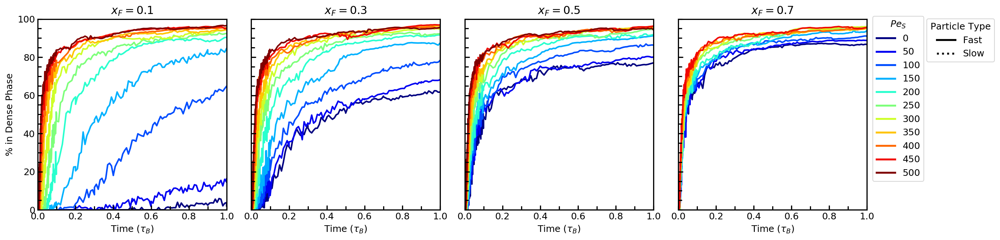

In [31]:
# All particles vs time
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_tot'] / params[0]['partAll'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 1.0)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
        ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


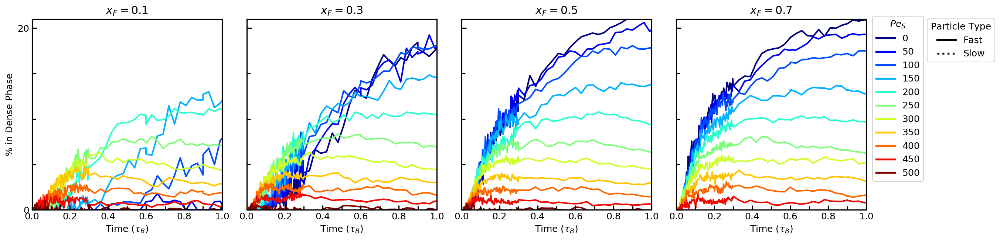

In [32]:
# Difference (short timescale)
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(3.0 * all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       (all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0) - (all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0),
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 1.0)
        ax[i].set_ylim(0, 21.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
        ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time_difference.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


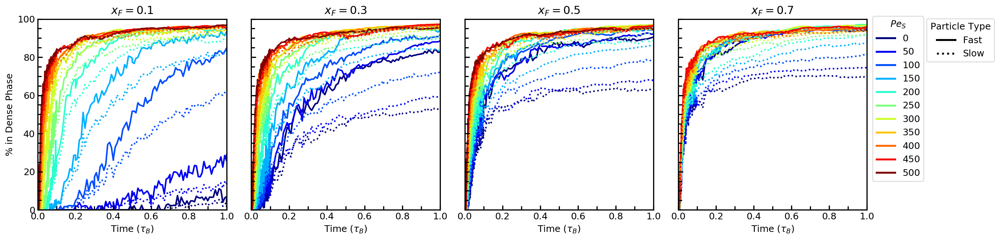

In [33]:
# Now I need to creat similar plots for the activity ratio study
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0,
                       label=params[0]['xF'][j] / 100.0,
                       linestyle=':',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=1
                      )
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 1.0)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(0.2))
        ax[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_vs_time.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


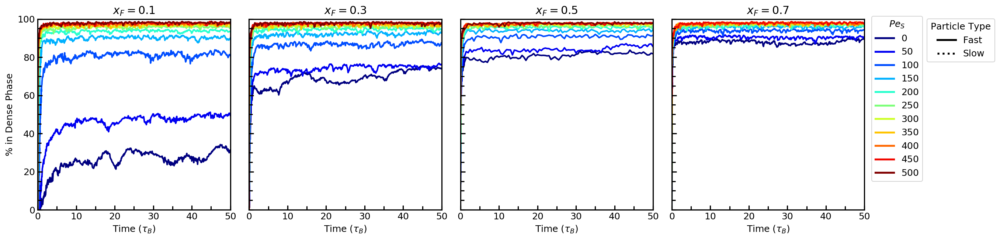

In [34]:
# Long time scale
# Now I need to creat similar plots for the activity ratio study
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_tot'] / params[0]['partAll'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 50.0)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(10))
        ax[i].xaxis.set_minor_locator(MultipleLocator(5))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time_long.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


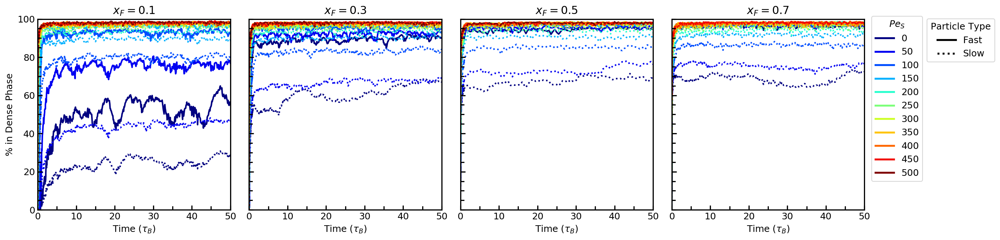

In [35]:
# Long time scale
# Now I need to creat similar plots for the activity ratio study
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0,
                       label=params[0]['xF'][j] / 100.0,
                       linestyle=':',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=1
                      )
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 50.0)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(10))
        ax[i].xaxis.set_minor_locator(MultipleLocator(5))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_vs_time_long.pdf', dpi=1000, bbox_inches = 'tight',
    pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


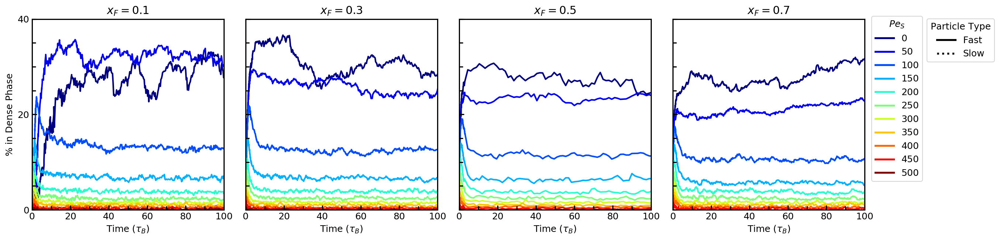

In [36]:
# Long time scale, difference in participation
# Difference (short timescale)
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(3.0 * all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       (all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0) - (all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0),
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(0, 100.0)
        ax[i].set_ylim(0, 40.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(20))
        ax[i].xaxis.set_minor_locator(MultipleLocator(10))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time_difference_long.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


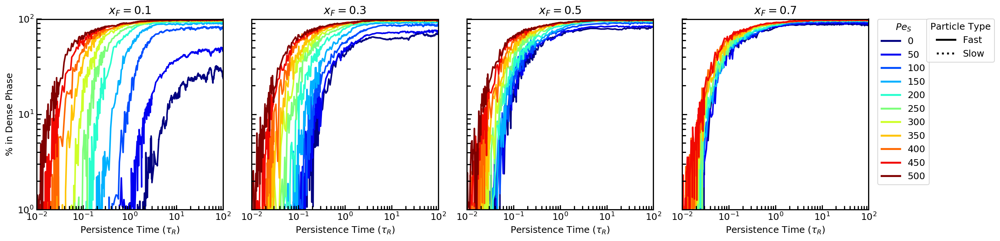

In [37]:
# Log-log plot: All particles
# Long time scale
# Now I need to creat similar plots for the activity ratio study
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j] * 3.0,
                       all_sims[0][j]['Dense_tot'] / params[0]['partAll'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(10**-2, 10**2)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Persistence Time $(\tau_{R})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(10))
        ax[i].xaxis.set_minor_locator(MultipleLocator(5))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
        
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 2, bbox_to_anchor=(1.05, 1),  borderaxespad=0.)
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time_long_loglog.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


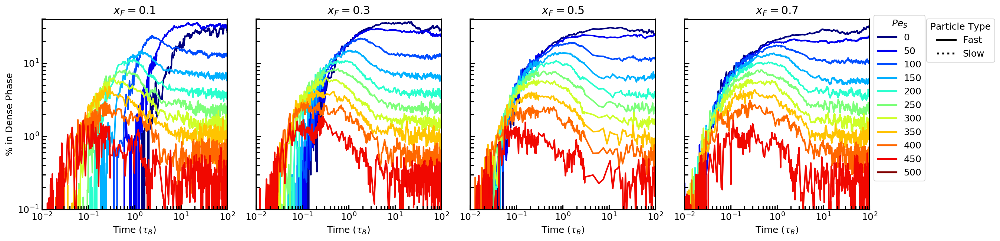

In [38]:
# Log-log percent difference
# Long time scale, difference in participation
# Difference (short timescale)
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i] and params[0]['peA'][j] != 500:
            ax[i].plot(3.0 * all_sims[0][j]['Timestep'] / params[0]['brownTime'][j],
                       (all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0) - (all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0),
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(10**-2, 100.0)
        ax[i].set_ylim(10**-1, 40.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Time $(\tau_{B})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(20))
        ax[i].xaxis.set_minor_locator(MultipleLocator(10))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
        
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.325, 0.125))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_all_vs_time_difference_loglog.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

[10.0, 30.0, 50.0, 70.0]


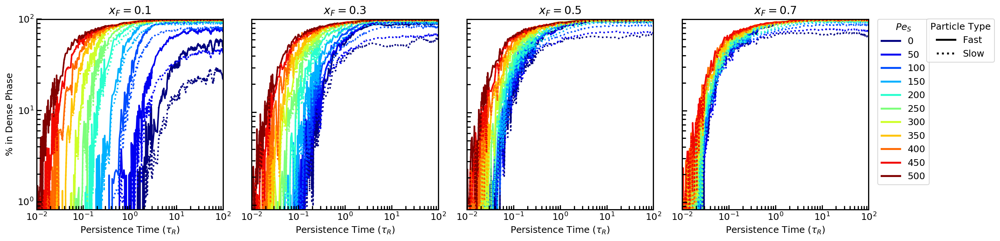

In [39]:
# Semi-log plot
# Long time scale
# Now I need to creat similar plots for the activity ratio study
# Let's get the PeS values for the xS study
xFinPeS = []
for i in xrange(len(fileContainer[0])):
    if params[0]['xF'][i] not in xFinPeS:
        xFinPeS.append(params[0]['xF'][i])
print(xFinPeS)

# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 4.5
fudge = 0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale, 1*scale+fudge))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j] * 3.0,
                       all_sims[0][j]['Dense_A'] / params[0]['partA'][j] * 100.0,
                       label=params[0]['xF'][j] / 100.0,
                       linestyle=':',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=1
                      )
            ax[i].plot(all_sims[0][j]['Timestep'] / params[0]['brownTime'][j] * 3.0,
                       all_sims[0][j]['Dense_B'] / params[0]['partB'][j] * 100.0,
                       label=params[0]['peA'][j] / 100.0,
                       linestyle='-',
                       lw=mylw,
                       c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                       zorder=0
                      )
        ax[i].set_xlim(10**-2, 10**2)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]/100.0))
        ax[i].set_xlabel(r'Persistence Time $(\tau_{R})$')

        # I can set all my ticks in this loop
        ax[i].xaxis.set_major_locator(MultipleLocator(10))
        ax[i].xaxis.set_minor_locator(MultipleLocator(5))
        ax[i].yaxis.set_major_locator(MultipleLocator(20))
        ax[i].yaxis.set_minor_locator(MultipleLocator(5))

        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
        
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')

        if i > 0:
            ax[i].tick_params(labelleft=False)
                
ax[0].set_ylabel('% in Dense Phase')

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for particle type
leglw = 2.5
legend_elements = [Line2D([0], [0], color=plt.cm.jet(0.0/500.0), lw=leglw, label=r'$0$'),
                   Line2D([0], [0], color=plt.cm.jet(50.0/500.0), lw=leglw, label=r'$50$'),
                   Line2D([0], [0], color=plt.cm.jet(100.0/500.0), lw=leglw, label=r'$100$'),
                   Line2D([0], [0], color=plt.cm.jet(150.0/500.0), lw=leglw, label=r'$150$'),
                   Line2D([0], [0], color=plt.cm.jet(200.0/500.0), lw=leglw, label=r'$200$'),
                   Line2D([0], [0], color=plt.cm.jet(250.0/500.0), lw=leglw, label=r'$250$'),
                   Line2D([0], [0], color=plt.cm.jet(300.0/500.0), lw=leglw, label=r'$300$'),
                   Line2D([0], [0], color=plt.cm.jet(350.0/500.0), lw=leglw, label=r'$350$'),
                   Line2D([0], [0], color=plt.cm.jet(400.0/500.0), lw=leglw, label=r'$400$'),
                   Line2D([0], [0], color=plt.cm.jet(450.0/500.0), lw=leglw, label=r'$450$'),
                   Line2D([0], [0], color=plt.cm.jet(500.0/500.0), lw=leglw, label=r'$500$')
                  ]
leg2 = [Line2D([0], [0], color='k', lw=leglw, linestyle='-', label=r'Fast'),
        Line2D([0], [0], color='k', lw=leglw, linestyle=':', label=r'Slow')
       ]
colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 2, bbox_to_anchor=(1.05, 1),  borderaxespad=0.)
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, bbox_to_anchor=(1.7, 0.75))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.15)
plt.tight_layout()
plt.savefig('slow_activity_vs_time_long_loglog.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

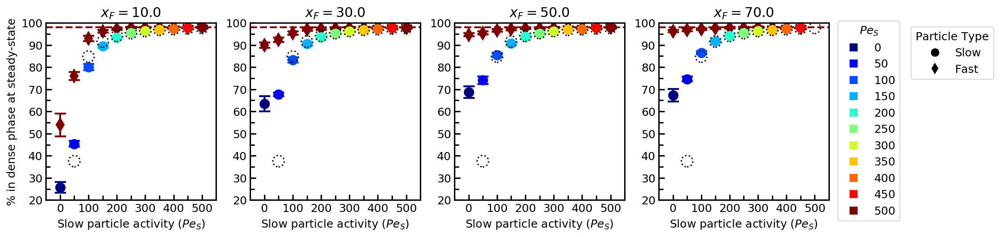

In [40]:
# Okay cool, do the same thing for SS values

# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale+fudge, 1*scale))
for i in xrange(len(xFinPeS)):
    flag = 0
    # Plot monodisperse simulations as horizontal lines
    for j in xrange(len(fileContainer[2])):
#         ax[i].axhline(y = all_SS[2]['Dense_A'][j],
#                       linestyle='--',
#                       label=params[2]['peA'][j],
#                       lw=mylw,
#                       c=plt.cm.jet(params[2]['peA'][j]/500.0),
#                       zorder=0
#                      )
        ax[i].scatter(params[2]['peA'][j],
                   all_SS[2]['Dense_A'][j],
                   marker='o',
                   s=150,
                   facecolors='none',
                   label=params[2]['peA'][j],
                   edgecolors='k',
                   zorder=2,
                   linestyle=':',
                      linewidth=1.5
                  )
    for j in xrange(len(fileContainer[0])):
        if params[0]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[0]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c=plt.cm.jet(500.0/500.0),
                          zorder=0
                         )
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_A'][j],
                           yerr=all_stdDev[0]['Dense_A'][j],
                           label=params[0]['peA'][j],
                           marker='o',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                           zorder=1
                          )
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_B'][j],
                           yerr=all_stdDev[0]['Dense_B'][j],
                           label=params[0]['peA'][j],
                           marker='d',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(500.0 / 500.0),
                           zorder=0
                          )
        ax[i].set_xlim(-50, 550)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]))
        ax[i].set_xlabel(r'Slow particle activity $(Pe_{S})$')

        # Set x-axis ticks
        ax[i].xaxis.set_major_locator(MultipleLocator(100))
        ax[i].xaxis.set_minor_locator(MultipleLocator(50))
        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
# ax[0].set_ylim(60, 100)
# ax[1].set_ylim(60, 100)
# ax[2].set_ylim(60, 100)
# ax[3].set_ylim(20, 100)
for i in xrange(figLength): ax[i].set_ylim(20,100)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(10))
ax[2].yaxis.set_minor_locator(MultipleLocator(5))
ax[3].yaxis.set_major_locator(MultipleLocator(10))
ax[3].yaxis.set_minor_locator(MultipleLocator(5))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(0.0/500.0), markersize=msz, label=r'$0$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(50.0/500.0), markersize=msz, label=r'$50$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(100.0/500.0), markersize=msz, label=r'$100$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(150.0/500.0), markersize=msz, label=r'$150$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(200.0/500.0), markersize=msz, label=r'$200$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(250.0/500.0), markersize=msz, label=r'$250$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(300.0/500.0), markersize=msz, label=r'$300$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(350.0/500.0), markersize=msz, label=r'$350$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(400.0/500.0), markersize=msz, label=r'$400$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(450.0/500.0), markersize=msz, label=r'$450$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(500.0/500.0), markersize=msz, label=r'$500$')
                  ]
# Legend for type
leglw = 2
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10)
       ]

colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.45, -0.15))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.0, 0.65))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.20)

plt.savefig('slow_activity_ss_w_std_dev.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

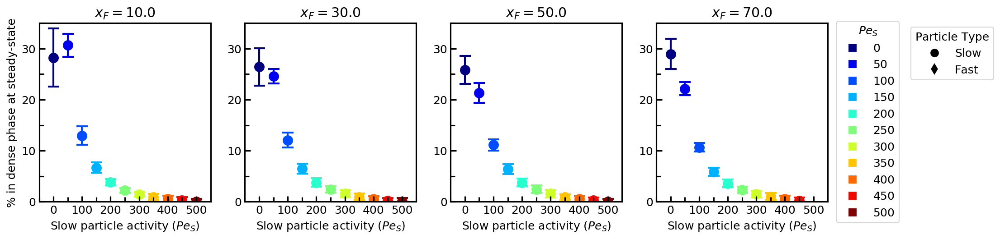

In [41]:
# Steady-state, constant xF plots, difference

# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale+fudge, 1*scale))
for i in xrange(len(xFinPeS)):
    for j in xrange(len(fileContainer[0])):
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].errorbar(params[0]['peA'][j],
                           (all_SS[0]['Dense_B'][j] - all_SS[0]['Dense_A'][j]),
                           yerr=propError(all_stdDev[0]['Dense_A'][j], all_stdDev[0]['Dense_B'][j]),
                           label=params[0]['peA'][j],
                           marker='o',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                           zorder=1
                          )
        ax[i].set_xlim(-50, 550)
        ax[i].set_ylim(0, 40.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]))
        ax[i].set_xlabel(r'Slow particle activity $(Pe_{S})$')

        # Set x-axis ticks
        ax[i].xaxis.set_major_locator(MultipleLocator(100))
        ax[i].xaxis.set_minor_locator(MultipleLocator(50))
        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
# ax[0].set_ylim(60, 100)
# ax[1].set_ylim(60, 100)
# ax[2].set_ylim(60, 100)
# ax[3].set_ylim(20, 100)
for i in xrange(figLength): ax[i].set_ylim(0,35)
# ... and ticks
ax[0].yaxis.set_major_locator(MultipleLocator(10))
ax[0].yaxis.set_minor_locator(MultipleLocator(5))
ax[1].yaxis.set_major_locator(MultipleLocator(10))
ax[1].yaxis.set_minor_locator(MultipleLocator(5))
ax[2].yaxis.set_major_locator(MultipleLocator(10))
ax[2].yaxis.set_minor_locator(MultipleLocator(5))
ax[3].yaxis.set_major_locator(MultipleLocator(10))
ax[3].yaxis.set_minor_locator(MultipleLocator(5))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(0.0/500.0), markersize=msz, label=r'$0$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(50.0/500.0), markersize=msz, label=r'$50$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(100.0/500.0), markersize=msz, label=r'$100$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(150.0/500.0), markersize=msz, label=r'$150$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(200.0/500.0), markersize=msz, label=r'$200$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(250.0/500.0), markersize=msz, label=r'$250$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(300.0/500.0), markersize=msz, label=r'$300$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(350.0/500.0), markersize=msz, label=r'$350$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(400.0/500.0), markersize=msz, label=r'$400$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(450.0/500.0), markersize=msz, label=r'$450$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(500.0/500.0), markersize=msz, label=r'$500$')
                  ]
# Legend for type
leglw = 2
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10)
       ]

colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.45, -0.15))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.0, 0.65))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.20)

plt.savefig('slow_activity_ss_w_std_dev_difference.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

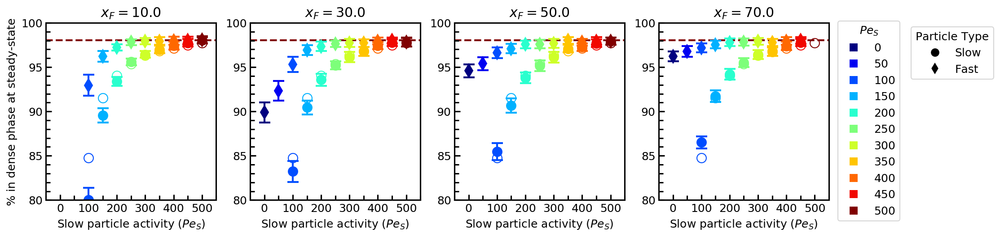

In [42]:
# Make zoomed in plot, all on same scale
# Okay cool, do the same thing for SS values

# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale+fudge, 1*scale))
for i in xrange(len(xFinPeS)):
    flag = 0
    # Plot monodisperse simulations as horizontal lines
    for j in xrange(len(fileContainer[2])):
#         ax[i].axhline(y = all_SS[2]['Dense_A'][j],
#                       linestyle='--',
#                       label=params[2]['peA'][j],
#                       lw=mylw,
#                       c=plt.cm.jet(params[2]['peA'][j]/500.0),
#                       zorder=0
#                      )
        ax[i].plot(params[2]['peA'][j],
                   all_SS[2]['Dense_A'][j],
                   marker='o',
                   markersize=mysz,
                   fillstyle='none',
                   label=params[2]['peA'][j],
                   c=plt.cm.jet(params[2]['peA'][j]/500.0),
                   zorder=0
                  )
    for j in xrange(len(fileContainer[0])):
        if params[0]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[0]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c=plt.cm.jet(500.0/500.0),
                          zorder=0
                         )
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_A'][j],
                           yerr=all_stdDev[0]['Dense_A'][j],
                           label=params[0]['peA'][j],
                           marker='o',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(params[0]['peA'][j] / max(distPeS))
                          )
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_B'][j],
                           yerr=all_stdDev[0]['Dense_B'][j],
                           label=params[0]['peA'][j],
                           marker='d',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(params[0]['peA'][j] / max(distPeS))
                          )
        ax[i].set_xlim(-50, 550)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]))
        ax[i].set_xlabel(r'Slow particle activity $(Pe_{S})$')

        # Set x-axis ticks
        ax[i].xaxis.set_major_locator(MultipleLocator(100))
        ax[i].xaxis.set_minor_locator(MultipleLocator(50))
        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
# ax[0].set_ylim(60, 100)
# ax[1].set_ylim(60, 100)
# ax[2].set_ylim(60, 100)
# ax[3].set_ylim(20, 100)
for i in xrange(figLength):
    ax[i].set_ylim(80,100)
    ax[i].yaxis.set_major_locator(MultipleLocator(5))
    ax[i].yaxis.set_minor_locator(MultipleLocator(1))
# ... and ticks
# ax[0].yaxis.set_major_locator(MultipleLocator(10))
# ax[0].yaxis.set_minor_locator(MultipleLocator(5))
# ax[1].yaxis.set_major_locator(MultipleLocator(10))
# ax[1].yaxis.set_minor_locator(MultipleLocator(5))
# ax[2].yaxis.set_major_locator(MultipleLocator(10))
# ax[2].yaxis.set_minor_locator(MultipleLocator(5))
# ax[3].yaxis.set_major_locator(MultipleLocator(10))
# ax[3].yaxis.set_minor_locator(MultipleLocator(5))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(0.0/500.0), markersize=msz, label=r'$0$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(50.0/500.0), markersize=msz, label=r'$50$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(100.0/500.0), markersize=msz, label=r'$100$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(150.0/500.0), markersize=msz, label=r'$150$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(200.0/500.0), markersize=msz, label=r'$200$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(250.0/500.0), markersize=msz, label=r'$250$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(300.0/500.0), markersize=msz, label=r'$300$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(350.0/500.0), markersize=msz, label=r'$350$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(400.0/500.0), markersize=msz, label=r'$400$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(450.0/500.0), markersize=msz, label=r'$450$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(500.0/500.0), markersize=msz, label=r'$500$')
                  ]
# Legend for type
leglw = 2
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10)
       ]

colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.45, -0.15))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.0, 0.65))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.20)

plt.savefig('slow_activity_ss_w_std_dev_zoom.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

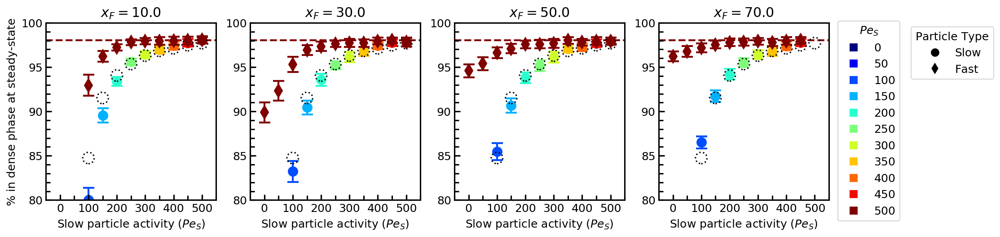

In [43]:
# Make zoomed in plot, all on same scale
# Okay cool, do the same thing for SS values

# Here I'll plot the steady state values (both fast and slow) with std dev overlayed
mysz = 10
# Overlay the fast and slow data for the particle fraction study
figLength = len(xFinPeS)
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, figLength, figsize=(figLength*scale+fudge, 1*scale))
for i in xrange(len(xFinPeS)):
    flag = 0
    # Plot monodisperse simulations as horizontal lines
    for j in xrange(len(fileContainer[2])):
#         ax[i].axhline(y = all_SS[2]['Dense_A'][j],
#                       linestyle='--',
#                       label=params[2]['peA'][j],
#                       lw=mylw,
#                       c=plt.cm.jet(params[2]['peA'][j]/500.0),
#                       zorder=0
#                      )
        ax[i].scatter(params[2]['peA'][j],
                   all_SS[2]['Dense_A'][j],
                   marker='o',
                   s=150,
                   facecolors='none',
                   label=params[2]['peA'][j],
                   edgecolors='k',
                   zorder=2,
                   linestyle=':',
                      linewidth=1.5
                  )
    for j in xrange(len(fileContainer[0])):
        if params[0]['peA'][j] == 500 and flag == 0:
            flag = 1
            ax[i].axhline(y = all_SS[0]['Dense_A'][j],
                          linestyle='--',
                          label=0.0,
                          lw=mylw,
                          c=plt.cm.jet(500.0/500.0),
                          zorder=0
                         )
        if params[0]['xF'][j] == xFinPeS[i]:
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_A'][j],
                           yerr=all_stdDev[0]['Dense_A'][j],
                           label=params[0]['peA'][j],
                           marker='o',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(params[0]['peA'][j] / max(distPeS)),
                           zorder=1
                          )
            ax[i].errorbar(params[0]['peA'][j],
                           all_SS[0]['Dense_B'][j],
                           yerr=all_stdDev[0]['Dense_B'][j],
                           label=params[0]['peA'][j],
                           marker='d',
                           markersize=mysz,
                           elinewidth=2,
                           capsize=6,
                           capthick=2,
                           c=plt.cm.jet(1.0)
                          )
        ax[i].set_xlim(-50, 550)
        ax[i].set_ylim(0, 100.0)
        ax[i].set_title(r'$x_{F}=$' + str(xFinPeS[i]))
        ax[i].set_xlabel(r'Slow particle activity $(Pe_{S})$')

        # Set x-axis ticks
        ax[i].xaxis.set_major_locator(MultipleLocator(100))
        ax[i].xaxis.set_minor_locator(MultipleLocator(50))
        ax[i].tick_params(which='major', length=6, width = 1.5)
        ax[i].tick_params(which='minor', length=5, width = 1.5)
                
ax[0].set_ylabel('% in dense phase at steady-state')
# Change limits
# ax[0].set_ylim(60, 100)
# ax[1].set_ylim(60, 100)
# ax[2].set_ylim(60, 100)
# ax[3].set_ylim(20, 100)
for i in xrange(figLength):
    ax[i].set_ylim(80,100)
    ax[i].yaxis.set_major_locator(MultipleLocator(5))
    ax[i].yaxis.set_minor_locator(MultipleLocator(1))
# ... and ticks
# ax[0].yaxis.set_major_locator(MultipleLocator(10))
# ax[0].yaxis.set_minor_locator(MultipleLocator(5))
# ax[1].yaxis.set_major_locator(MultipleLocator(10))
# ax[1].yaxis.set_minor_locator(MultipleLocator(5))
# ax[2].yaxis.set_major_locator(MultipleLocator(10))
# ax[2].yaxis.set_minor_locator(MultipleLocator(5))
# ax[3].yaxis.set_major_locator(MultipleLocator(10))
# ax[3].yaxis.set_minor_locator(MultipleLocator(5))

# Legend for line color (particle fraction)
# handles, labels = plt.gca().get_legend_handles_labels()
# by_label = OrderedDict(zip(labels, handles))
# ax[3].legend(by_label.values(), by_label.keys(),
#              title=r'$x_{F}$', loc = 4, bbox_to_anchor=(1.35, -0.015))

# Legend for color
msz=10
legend_elements = [Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(0.0/500.0), markersize=msz, label=r'$0$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(50.0/500.0), markersize=msz, label=r'$50$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(100.0/500.0), markersize=msz, label=r'$100$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(150.0/500.0), markersize=msz, label=r'$150$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(200.0/500.0), markersize=msz, label=r'$200$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(250.0/500.0), markersize=msz, label=r'$250$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(300.0/500.0), markersize=msz, label=r'$300$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(350.0/500.0), markersize=msz, label=r'$350$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(400.0/500.0), markersize=msz, label=r'$400$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(450.0/500.0), markersize=msz, label=r'$450$'),
                   Line2D([0], [0], marker='s', color='w', markerfacecolor=plt.cm.jet(500.0/500.0), markersize=msz, label=r'$500$')
                  ]
# Legend for type
leglw = 2
leg2 = [Line2D([0], [0], marker='o', color='w', label='Slow', markerfacecolor='k', markersize=10),
        Line2D([0], [0], marker='d', color='w', label='Fast', markerfacecolor='k', markersize=10)
       ]

colLeg = ax[-1].legend(title=r'$Pe_{S}$', handles=legend_elements, loc = 4, 
                      bbox_to_anchor=(1.45, -0.15))
ax[-1].legend(title=r'Particle Type', handles=leg2, loc = 4, 
             bbox_to_anchor=(2.0, 0.65))
ax[-1].add_artist(colLeg)

plt.subplots_adjust(wspace=0.20)

plt.savefig('slow_activity_ss_w_std_dev_zoom.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

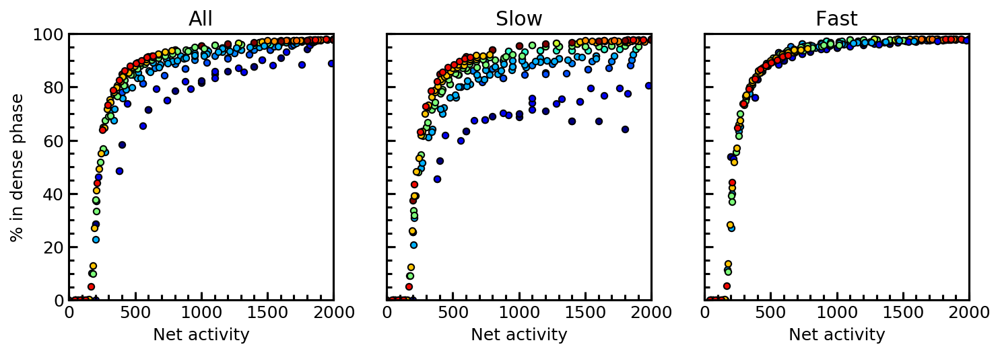

In [44]:
# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        # Plot all data
        ax[0].scatter(params[i]['theoryDenom'][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['peR'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['peR'][j]),
                      linewidth=1.0)
        
        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)
            
        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

plt.savefig('net_activity_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

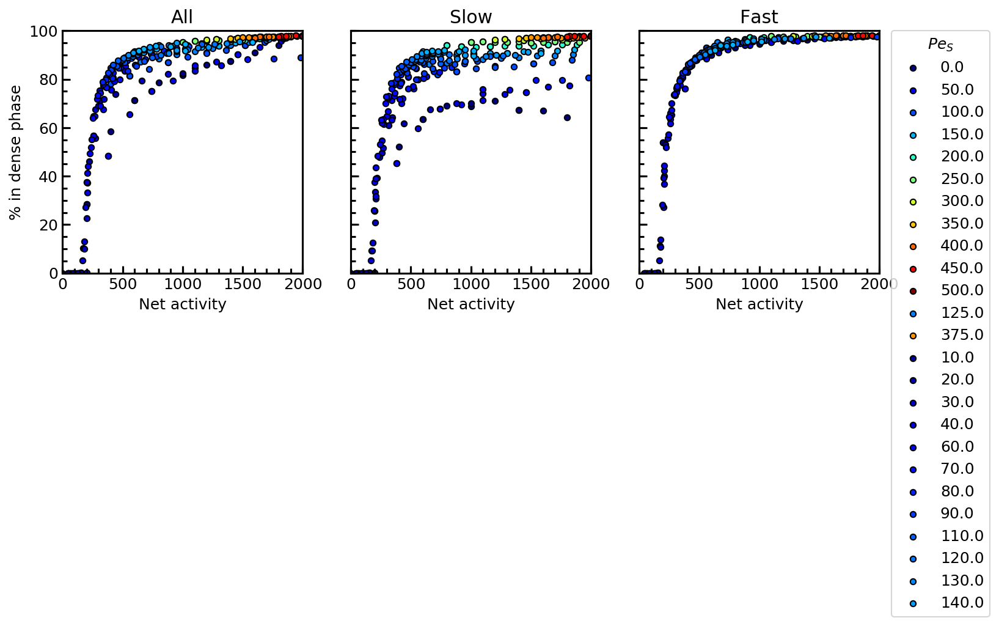

In [45]:
# Color wrt different variable
# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        # Plot all data
        ax[0].scatter(params[i]['theoryDenom'][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['peA'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['peA'][j] / 500.0),
                      linewidth=1.0)
        
        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peA'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peA'][j] / 500.0),
                          linewidth=1.0)
            
        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peA'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peA'][j] / 500.0),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

# plt.savefig('net_activity_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$Pe_{S}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)
plt.show()

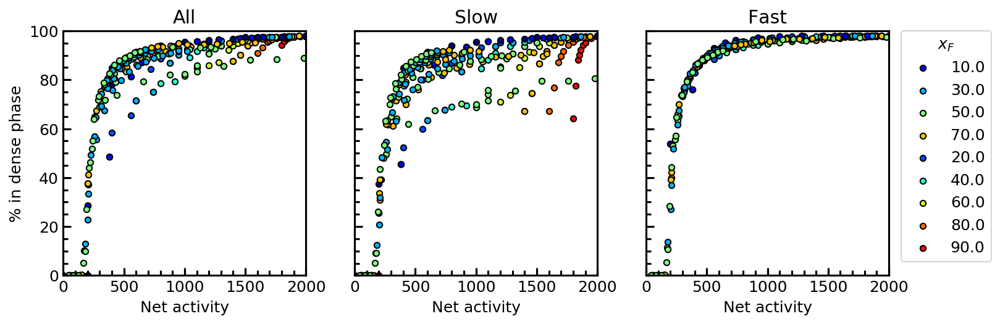

In [46]:
# Color wrt different variable
# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        # Plot all data
        ax[0].scatter(params[i]['theoryDenom'][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['xF'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['xF'][j] / 100.0),
                      linewidth=1.0)
        
        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['xF'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['xF'][j] / 100.0),
                          linewidth=1.0)
            
        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['xF'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['xF'][j] / 100.0),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

# plt.savefig('net_activity_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$x_{F}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)
plt.show()

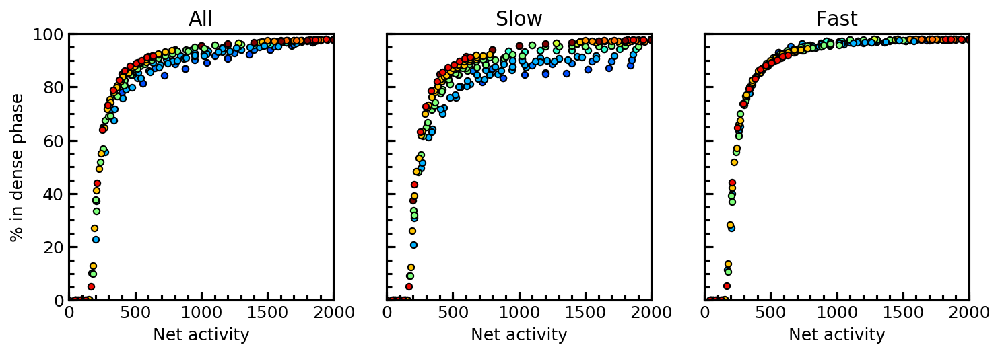

In [47]:
# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
            # Plot all data
            ax[0].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_tot'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

            # All but mono fast (for slow plot)
            if params[i]['xF'][j] != 100:
                ax[1].scatter(params[i]['theoryDenom'][j],
                              all_SS[i]['Dense_A'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)

            # All but mono slow (for fast plot)
            if params[i]['xF'][j] != 0:
                ax[2].scatter(params[i]['theoryDenom'][j],
                              all_SS[i]['Dense_B'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

plt.savefig('net_activity_collapse_omitted_data.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in double_scalars
  """
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


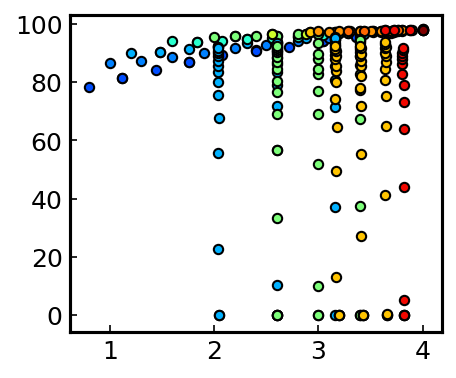

In [48]:
# What if we used a relative activity where the slow activity is 1.0
def weightedRelativePe(xF, PeS, PeF):
    xF /= 100.0
    xS = 1.0 - xF
    PeS /= PeF
    PeF = 1.0
    return 4.0 * ((xS * PeS) + (xF * PeF))

fitData = []
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
            fitData.append(weightedRelativePe(params[i]['xF'][j], params[i]['peA'][j], params[i]['peB'][j]))
            plt.scatter(fitData[-1],
                              all_SS[i]['Dense_tot'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)

168.0
a = 99.999, b = 40.0


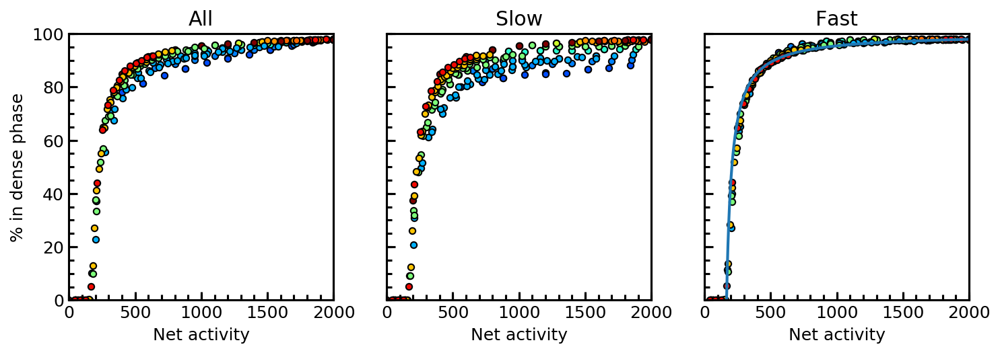

In [49]:
# Overlaying a fit onto the net activity plots
from scipy.optimize import curve_fit

def fplat(x, a, b):
    # a: the plateau y-value of the curve
    # b: the steepness of the curve (lower=steeper)
    return (a * x) / (b + x)
xfit = []
yfit = []

# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
            # Plot all data
            ax[0].scatter(params[i]['theoryDenom'][j],
                          all_SS[i]['Dense_tot'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

            # All but mono fast (for slow plot)
            if params[i]['xF'][j] != 100:
                ax[1].scatter(params[i]['theoryDenom'][j],
                              all_SS[i]['Dense_A'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)

            # All but mono slow (for fast plot)
            if params[i]['xF'][j] != 0:
                ax[2].scatter(params[i]['theoryDenom'][j],
                              all_SS[i]['Dense_B'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)
            if all_SS[i]['Dense_tot'][j] > 1 and all_SS[i]['Dense_tot'][j] < 7:
                critNetAct = params[i]['theoryDenom'][j]
                print(critNetAct)
            if all_SS[i]['Dense_tot'][j] > 2 and all_SS[i]['Dense_tot'][j] <= 2000:
                xfit.append(params[i]['theoryDenom'][j])
                yfit.append(all_SS[i]['Dense_B'][j])
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

# Let's fit the data

# Subtract off the x shift value (starts at 0,0)
for i in xrange(len(xfit)): xfit[i] -= critNetAct
# Plot x and y fit data
popt, pcov = curve_fit(fplat, xfit, yfit, bounds=([99.999, 30], [100.01, 40]))
# Previous predictions: a = 99.9000193432, b = 44.9223993832
print("a = {}, b = {}").format(*popt)

# Plot this fit
evalX = np.arange(0.0, 3000.0, 0.01)
evalY = np.zeros_like(evalX)
for i in xrange(len(evalX)):
    evalY[i] = fplat(evalX[i], popt[0], popt[1])
    evalX[i] += critNetAct
ax[2].plot(evalX, evalY, lw=2)

plt.savefig('net_activity_overlay.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

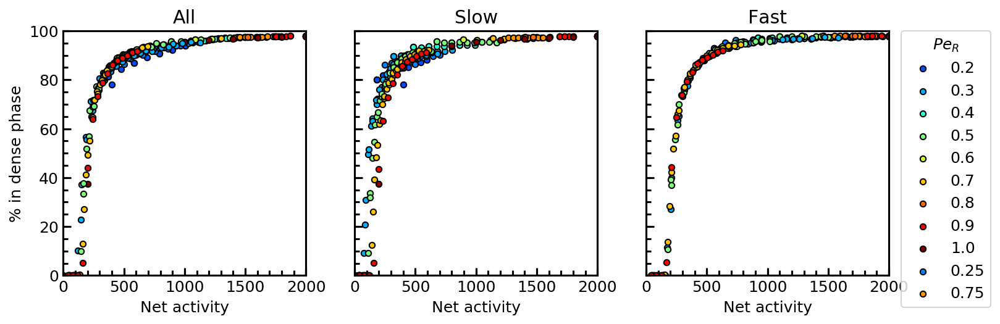

In [50]:
# Scale the net activity by the activity ratio
def compScaleInd(PeA, PeB, NetAct, xF, power):
    xF /= 100.0
    xS = 1 - xF
    PeR = PeA / PeB
    return (PeR**power) * NetAct

def compScaleTot(PeA, PeB, NetAct, xF, power):
    xF /= 100.0
    xS = 1 - xF
    PeR = PeA / PeB
    return NetAct * (((PeR**power)+1) / 2.0)

power = 0.7
scaleNetInd = []
scaleNetTot = []
for i in xrange(nSweeps):
    scaleNetTot.append([])
    scaleNetInd.append([])
    for j in xrange(len(fileContainer[i])):
        # Monodisperse
        if params[i]['xF'][j] == 100 or params[i]['xF'][j] == 0:
            scaleNetTot[i].append(params[i]['theoryDenom'][j])
            scaleNetInd[i].append(params[i]['theoryDenom'][j])
            
        else:
            scaleNetTot[i].append(compScaleTot(params[i]['peA'][j],
                                               params[i]['peB'][j],
                                               params[i]['theoryDenom'][j],
                                               params[i]['xF'][j],
                                               power))
            scaleNetInd[i].append(compScaleInd(params[i]['peA'][j],
                                               params[i]['peB'][j],
                                               params[i]['theoryDenom'][j],
                                               params[i]['xF'][j],
                                               power))

# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
            # Plot all data
            ax[0].scatter(scaleNetTot[i][j],
                          all_SS[i]['Dense_tot'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

            # All but mono fast (for slow plot)
            if params[i]['xF'][j] != 100:
                ax[1].scatter(scaleNetInd[i][j],
                              all_SS[i]['Dense_A'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)

            # All but mono slow (for fast plot)
            if params[i]['xF'][j] != 0:
                ax[2].scatter(params[i]['theoryDenom'][j],
                              all_SS[i]['Dense_B'][j],
                              marker='o',
                              s=mysz,
                              label=params[i]['peR'][j],
                              edgecolors='k',
                              c=plt.cm.jet(params[i]['peR'][j]),
                              linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(0, 2000)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(500))
    ax[i].xaxis.set_minor_locator(MultipleLocator(100))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$Pe_{R}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)

plt.savefig('net_activity_power_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

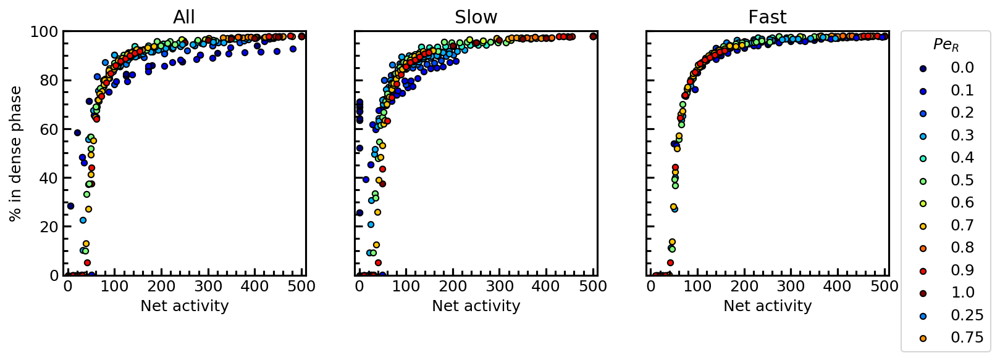

In [51]:
# Individual collapses are a function of the activity relative the fast activity
def weightAllNet(PeS, PeF, xF, exp):
    xF /= 100.0
    xS = 1.0 - xF
    PeR = PeS / PeF
    magNet = (PeS * xS) + (PeF * xF)
    ratNet = ((PeR**exp) * xS) + (1.0 * xF)
    return magNet * ratNet

def weightOneNet(PeS, PeF, xF, exp):
    xF /= 100.0
    xS = 1.0 - xF
    PeR = PeS / PeF
    magNet = (PeS * xS) + (PeF * xF)
    return magNet * (PeR**exp)
    
weightAll = []
weightOne = []
power = 0.6
for i in xrange(nSweeps):
    weightAll.append([])
    weightOne.append([])
    for j in xrange(len(fileContainer[i])):
        # Monodisperse
        if params[i]['xF'][j] == 100 or params[i]['xF'][j] == 0:
            weightAll[i].append(params[i]['theoryDenom'][j] / 4.0)
            weightOne[i].append(params[i]['theoryDenom'][j] / 4.0)
            
        else:
            weightAll[i].append(weightAllNet(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))
            weightOne[i].append(weightOneNet(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))

# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
#         if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
        # Plot all data
        ax[0].scatter(weightAll[i][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['peR'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['peR'][j]),
                      linewidth=1.0)

        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(weightOne[i][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j] / 4.0,
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(-10, 510)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(100))
    ax[i].xaxis.set_minor_locator(MultipleLocator(20))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$Pe_{R}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)

plt.savefig('net_activity_mag_rat_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

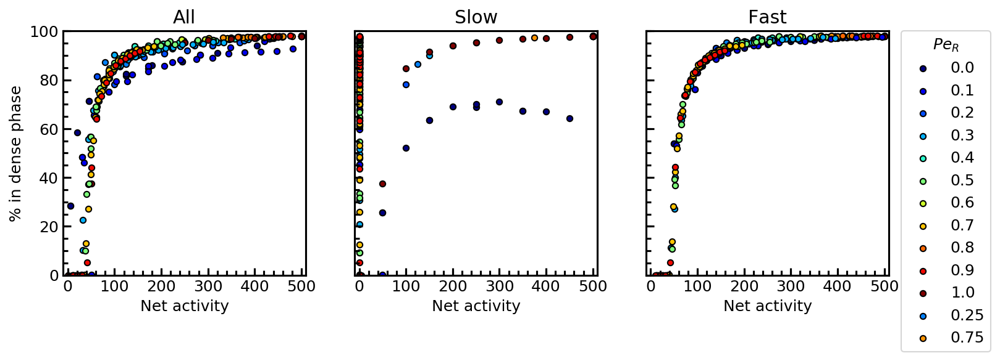

In [52]:
# Another shot at the collapse (considers act/pass case) ^PeS (Doesn't work)
def slowActPow(PeS, PeF, xF, exp):
    xF /= 100.0
    xS = 1 - xF
    PeR = PeS / PeF
    return (PeR**PeS)*((PeS * xS) + (PeF * xF))

weightAll = []
weightOne = []
power = 0.6
for i in xrange(nSweeps):
    weightAll.append([])
    weightOne.append([])
    for j in xrange(len(fileContainer[i])):
        # Monodisperse
        if params[i]['xF'][j] == 100 or params[i]['xF'][j] == 0:
            weightAll[i].append(params[i]['theoryDenom'][j] / 4.0)
            weightOne[i].append(params[i]['theoryDenom'][j] / 4.0)
            
        else:
            weightAll[i].append(weightAllNet(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))
            weightOne[i].append(slowActPow(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))

# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
#         if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
        # Plot all data
        ax[0].scatter(weightAll[i][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['peR'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['peR'][j]),
                      linewidth=1.0)

        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(weightOne[i][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j] / 4.0,
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(-10, 510)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(100))
    ax[i].xaxis.set_minor_locator(MultipleLocator(20))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$Pe_{R}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)

plt.savefig('net_activity_mag_rat_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

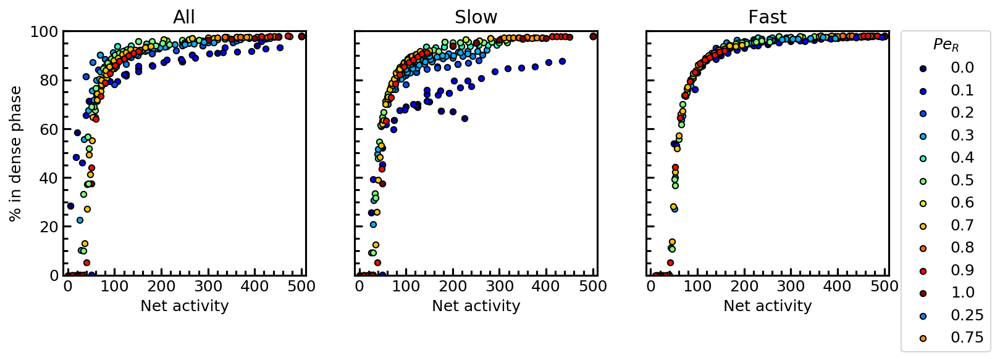

In [53]:
# A coefficient that will agree with passive/active and reduces to fast
def inverseRel(PeS, PeF, xF, exp):
    xF /= 100.0
    xS = 1.0 - xF
    PeR = PeS / PeF
    Coeff = 1 / ((2.0 - PeR)**(exp))
    magNet = (PeS * xS) + (PeF * xF)
    return Coeff * magNet

weightAll = []
weightOne = []
power = 1.0
for i in xrange(nSweeps):
    weightAll.append([])
    weightOne.append([])
    for j in xrange(len(fileContainer[i])):
        # Monodisperse
        if params[i]['xF'][j] == 100 or params[i]['xF'][j] == 0:
            weightAll[i].append(params[i]['theoryDenom'][j] / 4.0)
            weightOne[i].append(params[i]['theoryDenom'][j] / 4.0)
            
        else:
            weightAll[i].append(weightAllNet(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))
            weightOne[i].append(inverseRel(params[i]['peA'][j],
                                             params[i]['peB'][j],
                                             params[i]['xF'][j],
                                             power))

# Plot the net activity (for all data)
mysz = 20
scale = 3.5
fudge = 1.0
fig, ax = plt.subplots(1, 3, figsize=(3.0*scale+fudge, 1*scale))
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
#         if params[i]['peR'][j] != 0.0 and params[i]['peR'][j] != 0.1:
        # Plot all data
        ax[0].scatter(weightAll[i][j],
                      all_SS[i]['Dense_tot'][j],
                      marker='o',
                      s=mysz,
                      label=params[i]['peR'][j],
                      edgecolors='k',
                      c=plt.cm.jet(params[i]['peR'][j]),
                      linewidth=1.0)

        # All but mono fast (for slow plot)
        if params[i]['xF'][j] != 100:
            ax[1].scatter(weightOne[i][j],
                          all_SS[i]['Dense_A'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)

        # All but mono slow (for fast plot)
        if params[i]['xF'][j] != 0:
            ax[2].scatter(params[i]['theoryDenom'][j] / 4.0,
                          all_SS[i]['Dense_B'][j],
                          marker='o',
                          s=mysz,
                          label=params[i]['peR'][j],
                          edgecolors='k',
                          c=plt.cm.jet(params[i]['peR'][j]),
                          linewidth=1.0)
            
for i in xrange(3):
    ax[i].set_xlabel(r'Net activity')
    ax[i].set_ylabel(r'% in dense phase')
    ax[i].set_xlim(-10, 510)
    ax[i].set_ylim(0, 100)
    ax[i].xaxis.set_major_locator(MultipleLocator(100))
    ax[i].xaxis.set_minor_locator(MultipleLocator(20))
    ax[i].yaxis.set_major_locator(MultipleLocator(20))
    ax[i].yaxis.set_minor_locator(MultipleLocator(5))
    ax[i].tick_params(which='major', length=6, width = 1.5)
    ax[i].tick_params(which='minor', length=4, width = 1.5)
    
for i in range(1,3):
    ax[i].set_ylabel("")
    ax[i].set_yticklabels([])
    
ax[0].set_title("All")
ax[1].set_title("Slow")
ax[2].set_title("Fast")

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax[-1].legend(by_label.values(),
              by_label.keys(),
              title=r'$Pe_{R}$',
              loc = 2,
              bbox_to_anchor=(1.05, 1),
              borderaxespad=0.)

plt.savefig('net_activity_mag_rat_collapse.pdf', dpi=1000, bbox_inches = 'tight', pad_inches = 0)

In [54]:
# Really what we're doing is finding a function for this coefficient...
def findCoeff(PeS, PeF, xF, exp):
    xF /= 100.0
    xS = 1.0 - xF
    PeR = float(PeS) / PeF
    outCoeff = (2.0 - PeR)**exp
    return outCoeff



0.0


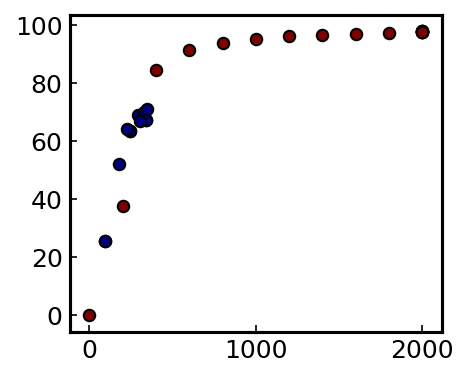

0.1


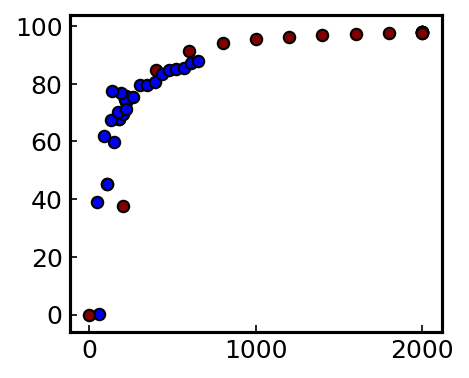

0.2


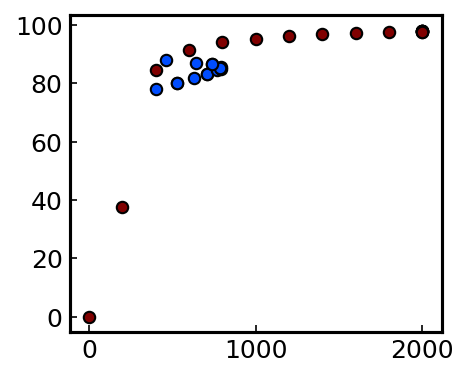

0.25


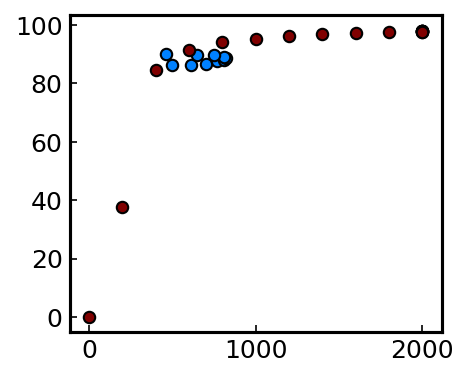

0.3


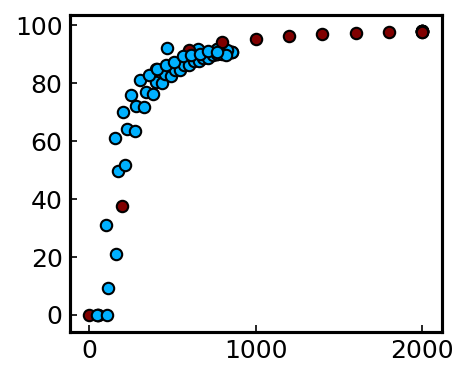

0.4


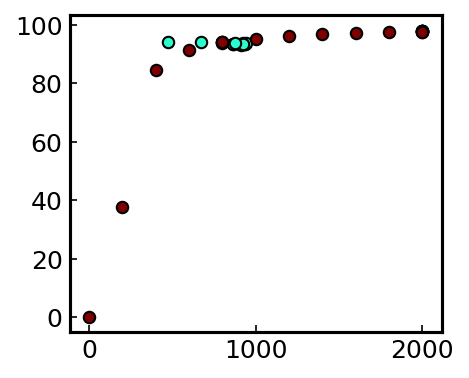

0.5


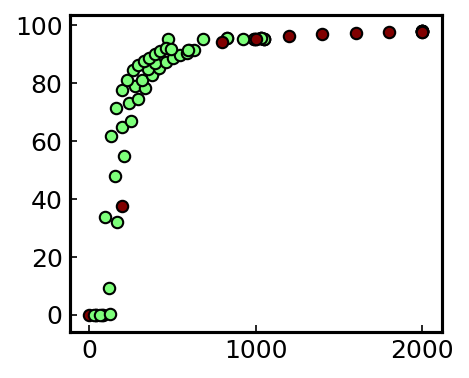

0.6


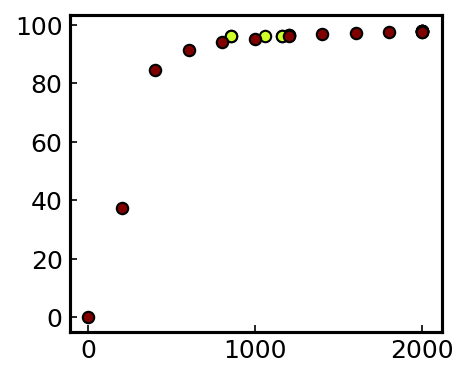

0.7


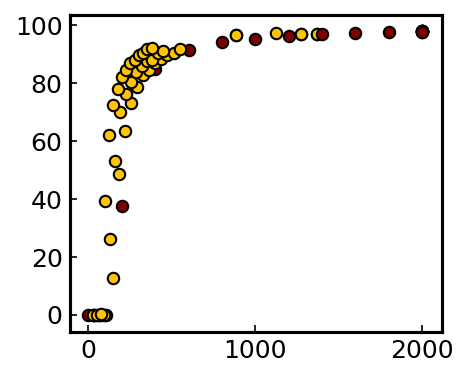

0.75


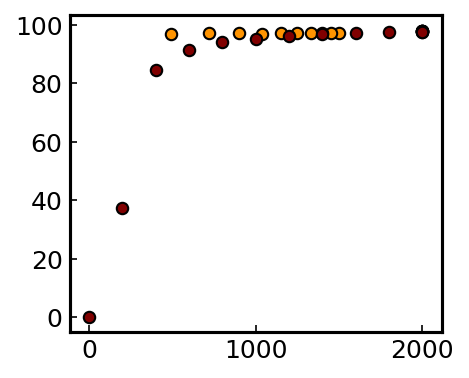

0.8


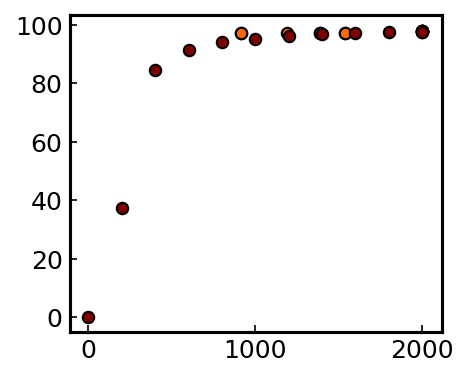

0.9


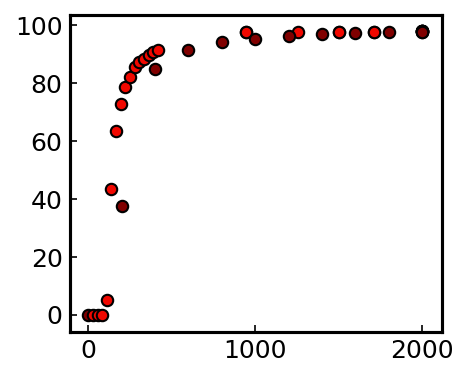

1.0


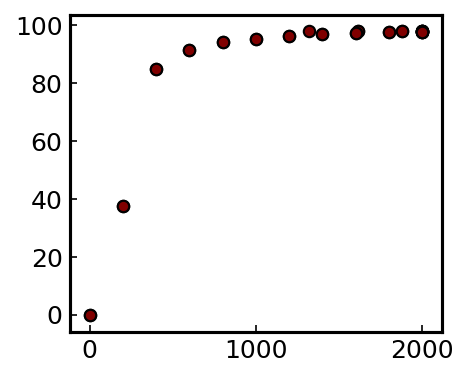

In [55]:
# Let's find the best coefficient to collapse each PeR (slow particles only)
coeffPeRs = []
for i in xrange(nSweeps):
    for j in xrange(len(fileContainer[i])):
        if params[i]['peR'][j] not in coeffPeRs:
            coeffPeRs.append(params[i]['peR'][j])
list.sort(coeffPeRs)
coeffs = np.zeros(len(coeffPeRs), dtype=np.float64)

coeffs[0] = 0.5
coeffs[1] = 0.3
coeffs[2] = 1.0
coeffs[3] = 1.0
coeffs[4] = 1.0
coeffs[5] = 1.0
coeffs[6] = 1.0
coeffs[7] = 1.0
coeffs[8] = 1.0
coeffs[9] = 1.0
coeffs[10] = 1.0
coeffs[11] = 1.0
coeffs[12] = 1.0

# Plot params
mysz = 30
# Plot each PeR against Monodisperse
for i in xrange(len(coeffPeRs)):
    for j in xrange(nSweeps):
        for k in xrange(len(fileContainer[j])):
            # Plot the mono system
            if params[j]['peR'][k] == 1.0:
                plt.scatter(params[j]['theoryDenom'][k],
                            all_SS[j]['Dense_A'][k],
                            marker='o',
                            s=mysz,
                            label=params[j]['peR'][k],
                            edgecolors='k',
                            c=plt.cm.jet(params[j]['peR'][k]),
                            linewidth=1.0)
#             # Special if for PeR == 0.0
#             if params[j]['peR'][k] == 0.0 and coeffPeRs[i] == 0.0:
#                 plt.scatter(params[j]['theoryDenom'][k] * coeffs[i] / (params[j]['peB'][k]**0.01),
#                             all_SS[j]['Dense_A'][k],
#                             marker='o',
#                             s=mysz,
#                             label=params[j]['peR'][k],
#                             edgecolors='k',
#                             c=plt.cm.jet(params[j]['peR'][k]),
#                             linewidth=1.0)
            # Plot the specific PeR
            if params[j]['peR'][k] == coeffPeRs[i]:
                plt.scatter(params[j]['theoryDenom'][k] * coeffs[i] * ((1.0-params[j]['xF'][k]/100.0)**0.6),
                            all_SS[j]['Dense_A'][k],
                            marker='o',
                            s=mysz,
                            label=params[j]['peR'][k],
                            edgecolors='k',
                            c=plt.cm.jet(params[j]['peR'][k]),
                            linewidth=1.0)
    print(coeffPeRs[i])
    plt.show()

In [56]:
# It looks like scaling by the particle fraction is a good idea